In [1]:
import pandas as pd 

In [2]:
df_part5_final = pd.read_csv('data/전처리/전처리part5_final.csv', encoding='CP949')
df_part5_final 

,회사명,거래소코드,회계년도,상장일,상장폐지일,부실기업1,부실기업2,부실기업,업종,경기민감도,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
0,(주)CMG제약,58820,201112,200108,NaN,0.0,0,0,제조업,1,...,19.715837,204.066667,0.66,0.984333,2.01,1.25,1.55,6.42,2.45,0.86
1,(주)CMG제약,58820,201212,200108,NaN,0.0,0,0,제조업,1,...,18.562172,425.291045,0.39,0.655130,0.93,0.52,0.57,5.71,1.85,0.42
2,(주)CMG제약,58820,201312,200108,NaN,0.0,0,0,제조업,1,...,17.604882,411.485294,0.36,0.506332,1.26,0.48,0.52,5.39,2.07,0.42
3,(주)CMG제약,58820,201412,200108,NaN,0.0,0,0,제조업,1,...,30.445768,354.432927,0.40,0.464339,2.85,0.68,0.80,4.77,1.86,0.56
4,(주)CMG제약,58820,201512,200108,NaN,0.0,0,0,제조업,1,...,28.007199,362.769231,0.47,0.564493,2.88,0.99,1.22,5.22,2.10,0.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16629,흥아해운(주),3280,201612,197606,NaN,0.0,0,0,운수 및 창고업,0,...,0.000000,1000.623142,0.95,5.113218,1.20,6.98,7.96,56.47,25.24,2.19
16630,흥아해운(주),3280,201712,197606,NaN,1.0,0,1,운수 및 창고업,0,...,0.000000,905.653637,0.93,4.964267,1.12,7.68,9.30,44.09,23.08,2.09
16631,흥아해운(주),3280,201812,197606,NaN,1.0,0,1,운수 및 창고업,0,...,0.000000,983.400754,0.91,4.550483,1.03,6.73,8.14,38.87,19.15,1.75
16632,흥아해운(주),3280,201912,197606,NaN,1.0,0,1,운수 및 창고업,0,...,0.000000,1140.268437,0.17,5.407265,0.18,1.01,1.16,7.70,4.78,0.28


### inf, -inf 값 확인

In [3]:
import numpy as np
df_part5_final[(df_part5_final == np.inf).any(axis=1)]

,회사명,거래소코드,회계년도,상장일,상장폐지일,부실기업1,부실기업2,부실기업,업종,경기민감도,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률


In [4]:
df_part5_final[(df_part5_final == -np.inf).any(axis=1)]

,회사명,거래소코드,회계년도,상장일,상장폐지일,부실기업1,부실기업2,부실기업,업종,경기민감도,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률


In [5]:
df_part5_final.isna().sum()

회사명                      0
거래소코드                    0
회계년도                     0
상장일                      0
상장폐지일                15887
부실기업1                  178
부실기업2                    0
부실기업                     0
업종                       0
경기민감도                    0
총자본증가율                   0
순이익증가율                   0
자기자본증가율                  0
매출액증가율                   0
종업원수증가율                  0
정상영업손익증가율                0
매출액정상영업이익률               0
매출액순이익률                  0
총자본순이익률                  0
총자본정상영업이익률               0
자기자본정상영업이익률              0
자기자본순이익률                 0
금융비용부담률                  0
수지비율                     0
사내유보 대 자기자본비율            0
1주당매출액                   0
1주당순이익                   0
1주당 CASH FLOW            0
1주당순자산                   0
유보율                      0
자기자본구성비율                 0
유동비율                     0
당좌비율                     0
현금비율                     0
매출채권 대 매입채무비율            0
부채비율                     0
이자보상배율                   0
C

## 이상치 제거 전 정규성 검정

### 이상치 제거 전 히스토그램

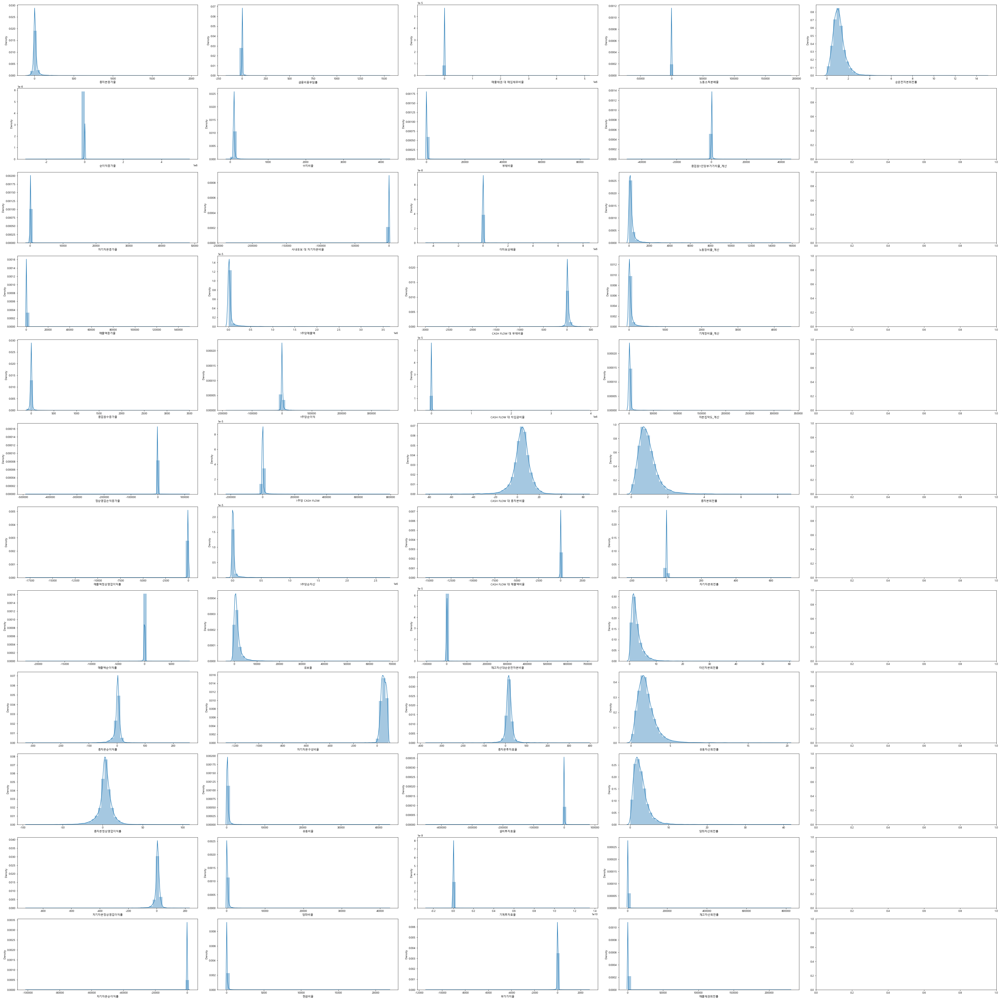

In [6]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(df_part5_final.columns[10:], axs.T.ravel()):
    sns.distplot(df_part5_final[col], ax=ax)

plt.show()

### 이상치 제거 전 박스플롯

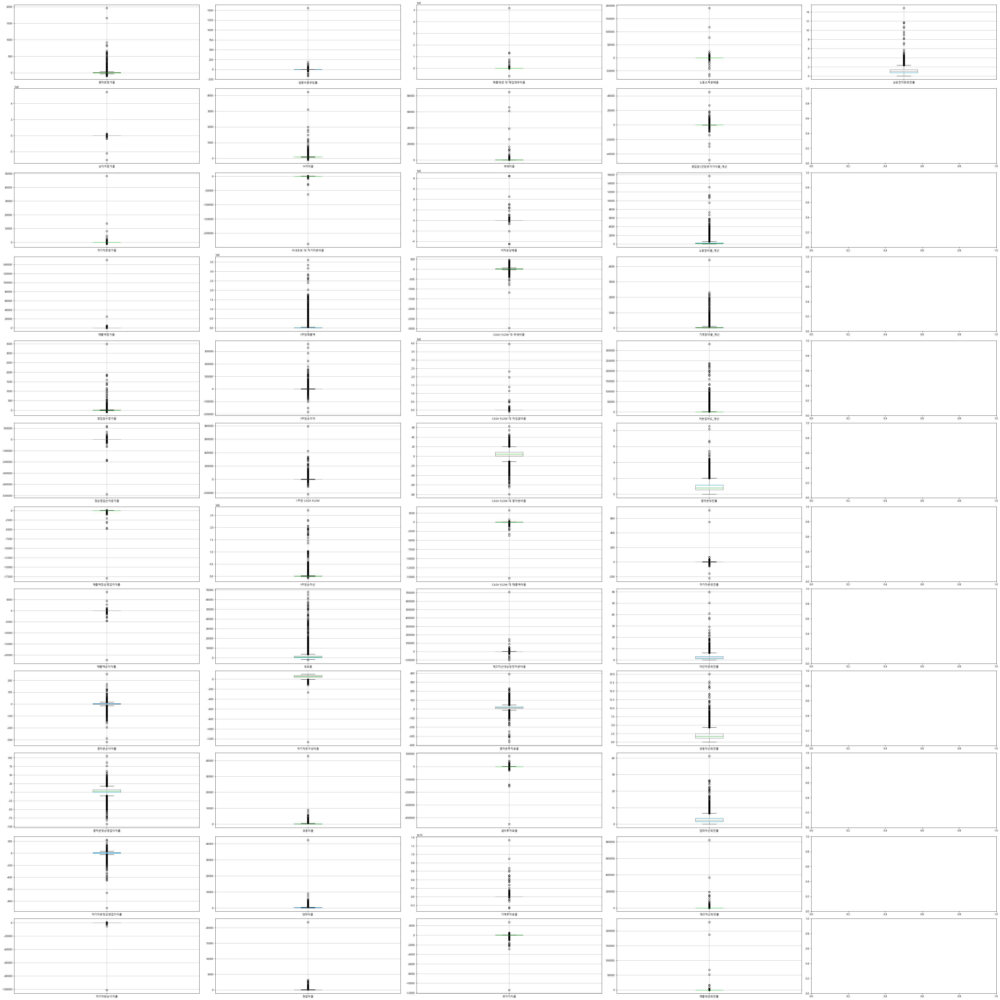

In [7]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(df_part5_final.columns[10:], axs.T.ravel()):
    df_part5_final[[col]].boxplot(ax=ax)

plt.show()

### 이상치 제거 전 Q-Q Plot

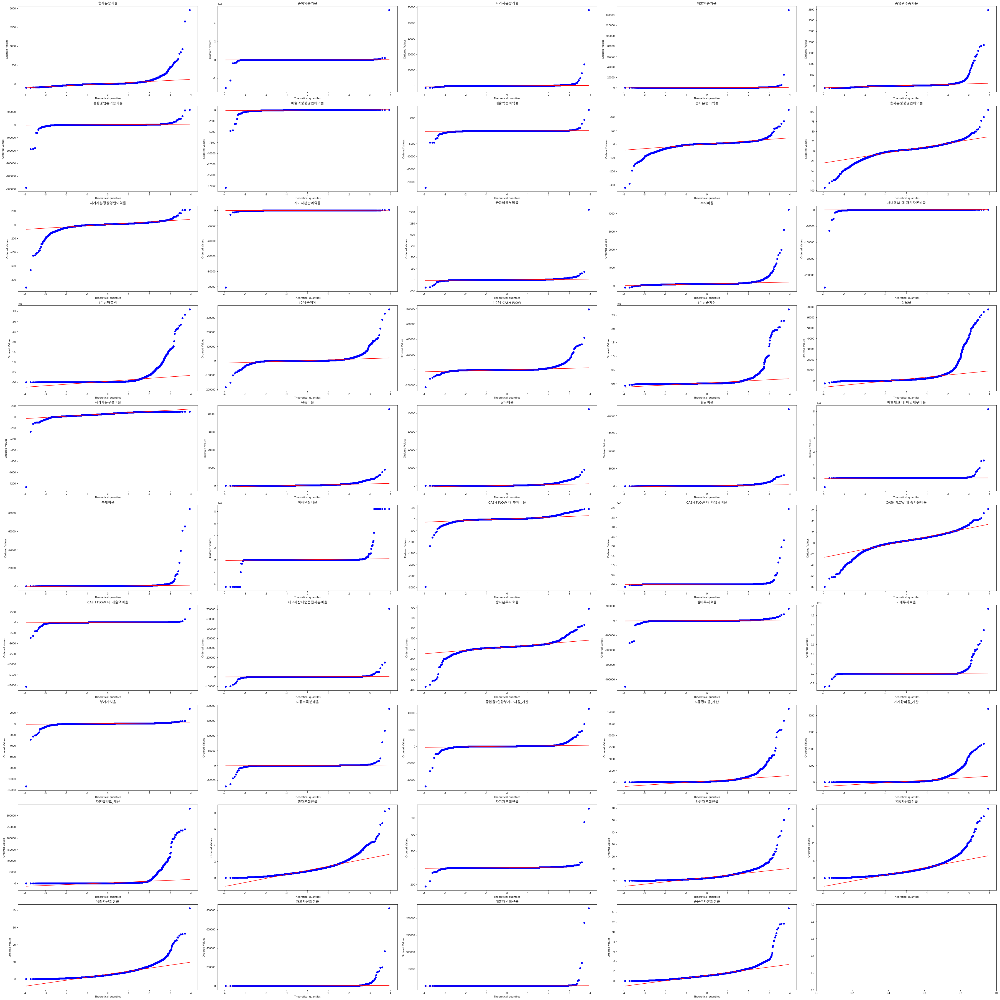

In [8]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), df_part5_final.iloc[:, 10:]):
       stats.probplot(df_part5_final[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

### 이상치 제거 전 K-S Test

In [9]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [10]:
ks_test(df_part5_final.iloc[:, 10:])

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### 이상치 제거 전 Shapiro–Wilk test

In [11]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [12]:
# 컬럼별 pvalue 값 출력
shap_pct(df_part5_final.iloc[:, 10:])

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### 등분산, 이분산 확인

In [13]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = df_part5_final.iloc[:, 10:]

nc_df = df_part5_final[df_part5_final['부실기업'] ==0]  # normal company 
bc_df = df_part5_final[df_part5_final['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.0 -> 등분산
**********************************************************
순이익증가율 pvalue 0.112 -> 이분산
**********************************************************
자기자본증가율 pvalue 0.001 -> 등분산
**********************************************************
매출액증가율 pvalue 0.79 -> 이분산
**********************************************************
종업원수증가율 pvalue 0.0 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.231 -> 이분산
**********************

In [14]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,이분산
자기자본증가율,등분산
매출액증가율,이분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [15]:
lev_sced_df.value_counts()

등분산성
등분산     33
이분산     16
dtype: int64

### 이상치 제거 전 Welch's ttest_ind

In [16]:
import numpy as np
from scipy.stats import ttest_ind

welch_df = df_part5_final.iloc[:, 10:]

nc_df = df_part5_final.iloc[:, 10:][df_part5_final['부실기업'] ==0]  # normal company 
bc_df = df_part5_final.iloc[:, 10:][df_part5_final['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [17]:
ttest_homo(nc_df, bc_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.025
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.423
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: 0.217
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
******************************************************

In [18]:
# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [19]:
ttest_hetero(nc_df, bc_df)

이분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순이익증가율 의 pvalue: 0.068
**********************************************************
이분산을 가정한 자기자본증가율 의 pvalue: 0.311
**********************************************************
이분산을 가정한 매출액증가율 의 pvalue: 0.012
**********************************************************
이분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 정상영업손익증가율 의 pvalue: 0.008
**********************************************************
이분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
****************************************************

## 로그변환 후 정규성 검정

### 로그변환 후 히스토그램

### inf, -inf 값 확인

In [20]:
import numpy as np

df_part5_final[df_part5_final.isin([np.inf, -np.inf]).any(axis=1)]

,회사명,거래소코드,회계년도,상장일,상장폐지일,부실기업1,부실기업2,부실기업,업종,경기민감도,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률


### 로그 변환

In [21]:
log_df_part5_final = np.log1p(df_part5_final.iloc[:, 10:])

In [22]:
log_df_part5_final[log_df_part5_final.isin([np.inf, -np.inf]).any(axis=1)]

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
404,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.198370,6.365779,0.398776,0.918779,0.548121,0.652325,0.883768,1.294727,1.220830,0.398776
477,3.079087,3.828356,2.906450,3.181291,3.382015,3.190076,3.045950,2.937573,2.941804,3.050220,...,0.000000,5.278348,0.693147,0.807805,1.830980,0.951658,0.951658,10.211934,2.444085,0.806476
502,NaN,4.503399,NaN,2.131392,NaN,4.632358,1.335001,-inf,-0.430783,0.678034,...,0.250805,7.841991,0.300105,0.654544,0.438255,0.751416,0.947789,1.572774,1.693779,0.343590
584,3.210519,NaN,3.428898,NaN,1.383791,NaN,0.641854,0.530628,0.364643,0.451076,...,0.000000,5.403829,0.488580,0.552895,1.646734,0.620576,0.631272,4.088494,1.371181,0.542324
843,3.990987,NaN,NaN,2.631497,1.987874,NaN,NaN,NaN,NaN,-1.714798,...,0.000000,6.989554,0.350657,0.843261,0.476234,0.470004,0.470004,0.000000,1.706565,0.285179
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14967,NaN,3.465409,NaN,NaN,NaN,4.000066,NaN,NaN,NaN,NaN,...,5.751806,7.036886,0.542324,0.305659,0.620576,0.806476,1.057790,1.536867,1.460938,0.470004
15215,NaN,5.085120,3.037136,1.987562,-inf,3.930199,2.833213,2.531313,2.729159,3.035434,...,1.541368,5.842399,0.806476,1.244837,1.252763,1.355835,1.430311,3.460095,2.352327,0.900161
15326,NaN,NaN,NaN,0.503129,2.553344,NaN,-inf,NaN,NaN,-1.347074,...,5.348449,6.648856,0.553885,0.953729,0.858662,1.530395,1.786747,2.658159,2.078191,0.806476
15525,2.550766,NaN,2.966338,NaN,4.561636,NaN,NaN,-inf,NaN,NaN,...,0.000000,7.459095,0.760806,1.532768,1.018847,1.439835,1.678964,2.587012,1.877937,0.862890


### 로그 변환 후 히스토그램

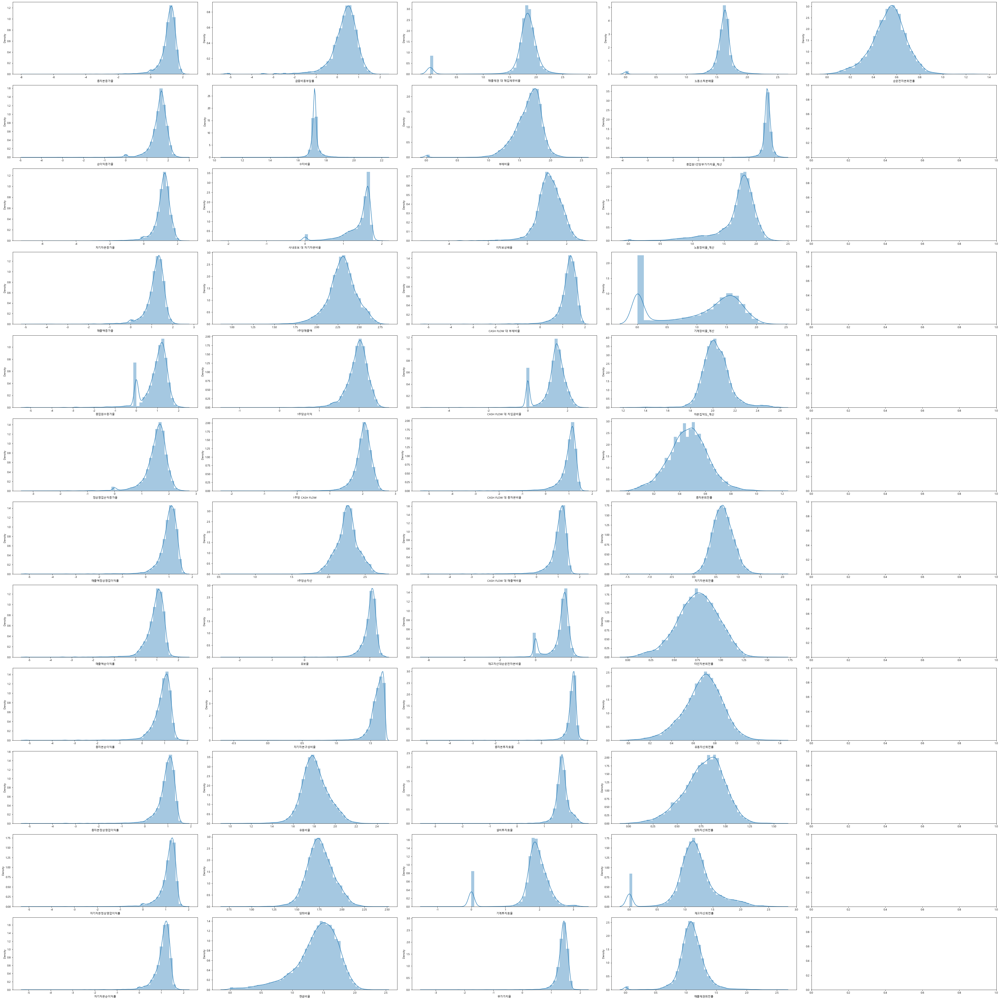

In [23]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for i in log_df_part5_final.columns:
    log_df_part5_final[i] = np.log1p(log_df_part5_final[i])

for col, ax in zip(log_df_part5_final, axs.T.ravel()):
    sns.distplot(log_df_part5_final[col], ax=ax)

plt.show()

## 스케일링

### StandardScaler

In [24]:
from sklearn.preprocessing import StandardScaler

sscaler = StandardScaler()
sscaler.fit(df_part5_final.iloc[:, 10:])

scaled_df_part5 = sscaler.transform(df_part5_final.iloc[:, 10:])

scaled_df_part5 = pd.DataFrame(scaled_df_part5, columns=df_part5_final.iloc[:, 10:].columns)

In [25]:
scaled_df_part5

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
0,0.067722,0.002429,-0.029491,0.029961,0.012234,0.264041,0.030322,-0.014449,-0.449881,-0.081358,...,-0.230885,-0.192178,-0.469479,-0.137009,-0.303137,-0.604050,-0.629128,-0.033660,-0.018994,-0.443843
1,2.351106,-0.005738,0.144271,-0.024910,-0.084520,-0.143644,-0.158852,-0.169872,-1.204371,-1.466875,...,-0.239925,-0.170593,-0.974784,-0.179972,-0.806402,-1.207267,-1.136389,-0.033751,-0.019243,-1.162179
2,-0.295310,0.046346,0.094415,0.003817,-0.044490,0.136446,0.032055,0.033178,0.001334,-0.190357,...,-0.247427,-0.171940,-1.030929,-0.199391,-0.652626,-1.240320,-1.162269,-0.033792,-0.019152,-1.162179
3,-0.153785,-0.000028,-0.042430,-0.008024,0.298366,0.000146,0.019606,0.029541,-0.016419,-0.260026,...,-0.146802,-0.177507,-0.956069,-0.204872,0.088290,-1.075055,-1.017338,-0.033871,-0.019239,-0.933617
4,-0.308418,-0.045777,-0.053588,-0.001818,-0.158835,-0.128451,-0.053869,-0.038382,-0.508317,-0.852213,...,-0.165911,-0.176693,-0.825064,-0.191801,0.102270,-0.818894,-0.799940,-0.033813,-0.019139,-0.623427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16629,0.256025,-0.004223,-0.014599,-0.019114,0.213639,-0.005533,0.011713,0.016377,-0.182111,-0.272387,...,-0.385383,-0.114456,0.073256,0.401837,-0.680586,4.130791,2.688770,-0.027258,-0.009510,1.727489
16630,-0.517463,-0.005476,-0.140024,-0.017299,-0.111266,-0.055954,-0.002918,-0.015837,-0.638503,-0.510610,...,-0.385383,-0.123723,0.035826,0.382398,-0.717864,4.709218,3.382372,-0.028841,-0.010408,1.564231
16631,-0.372340,0.000531,-0.135407,-0.026130,-0.314826,-0.028689,-0.024864,-0.028713,-0.811592,-0.858955,...,-0.385383,-0.116137,-0.001604,0.328397,-0.759803,3.924209,2.781941,-0.029509,-0.012044,1.009153
16632,-1.348834,0.001662,-0.185864,-0.090947,-1.101778,0.022582,-0.070489,-0.214388,-0.652557,-0.572413,...,-0.385383,-0.100831,-1.386514,0.440212,-1.155890,-0.802367,-0.830997,-0.033496,-0.018024,-1.390740


### StandardScaler 히스토그램

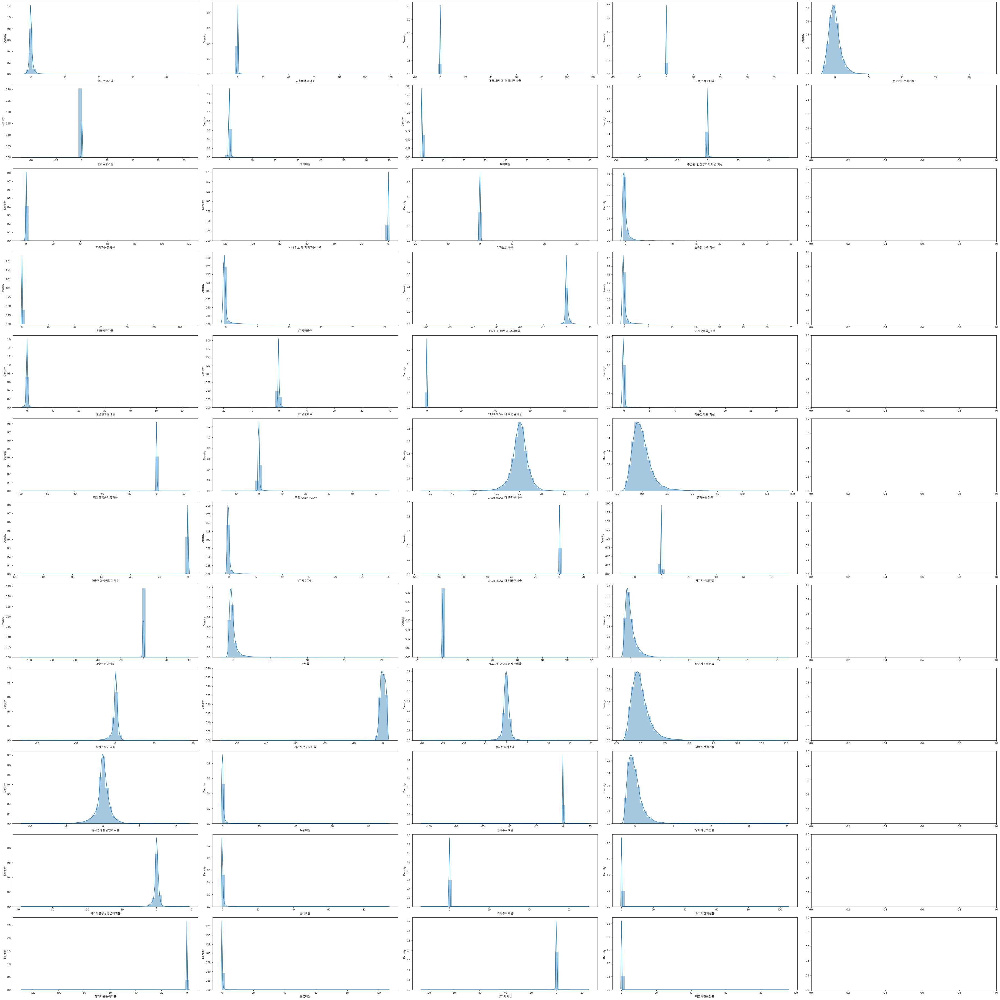

In [26]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(scaled_df_part5, axs.T.ravel()):
    sns.distplot(scaled_df_part5[col], ax=ax)

plt.show()

### StandardScaler 박스플롯

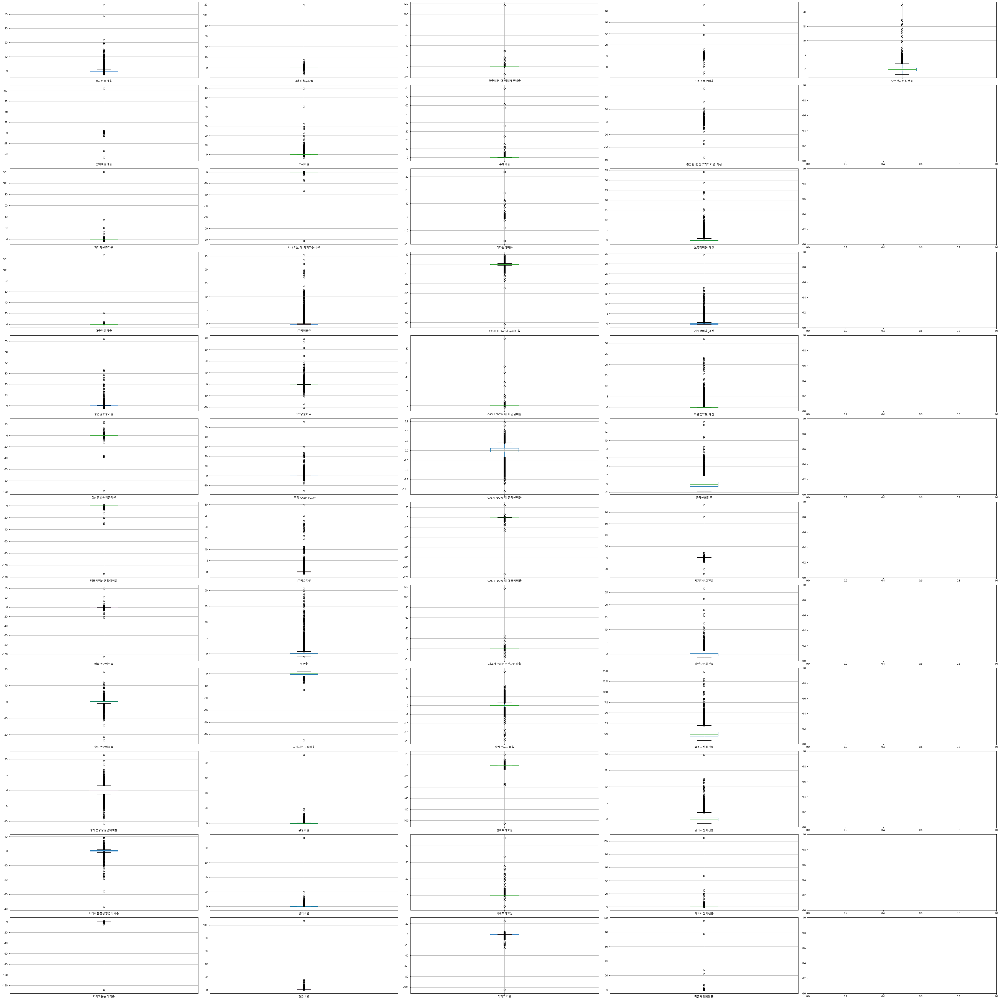

In [27]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(scaled_df_part5, axs.T.ravel()):
    scaled_df_part5[[col]].boxplot(ax=ax)

plt.show()

### StandardScaler Q-Q Plot

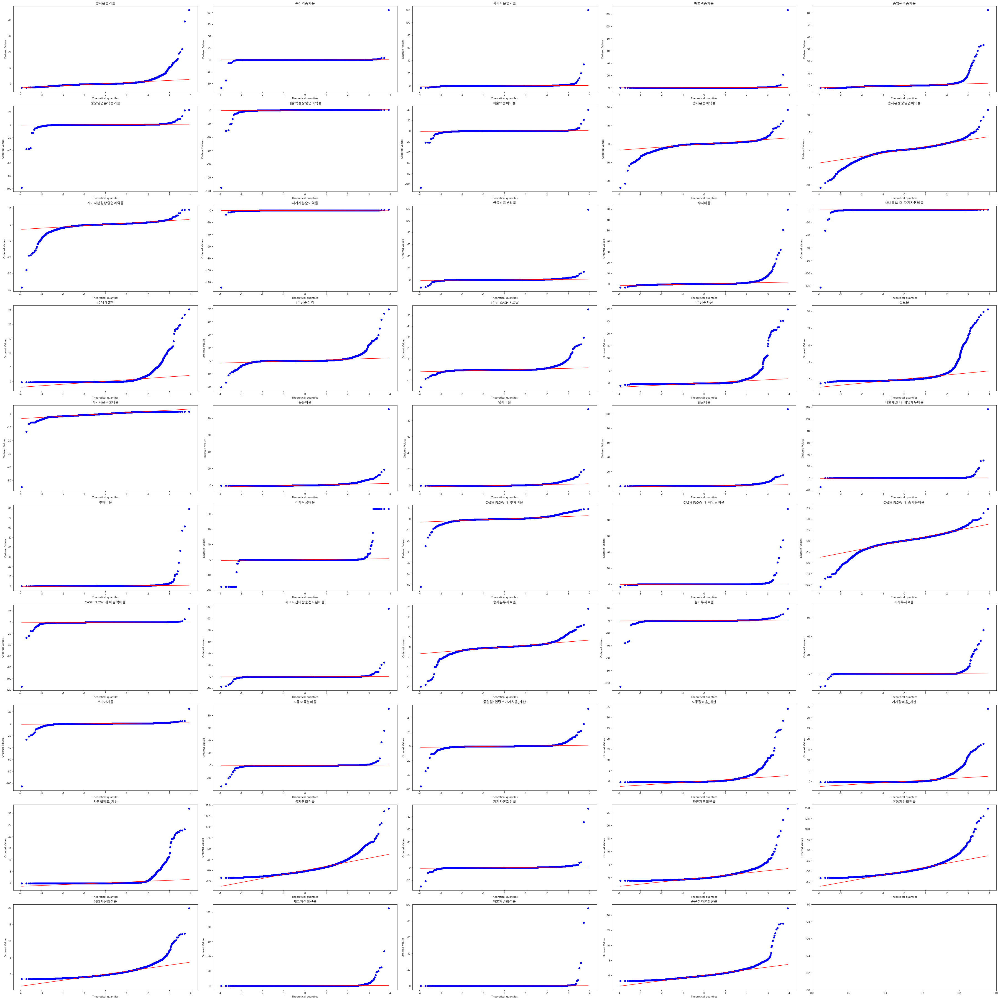

In [28]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), scaled_df_part5):
       stats.probplot(scaled_df_part5[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

### StandardScaler K-S Test

In [29]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [30]:
ks_test(scaled_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 3.1249054990917825e-244
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 2.2305083144949743e-34
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 5.288858849319743e-92
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 1.8989206111039426e-252
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 

### StandardScaler Shapiro–Wilk test

In [31]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [32]:
# 컬럼별 pvalue 값 출력
shap_pct(scaled_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### StandardScaler 등분산, 이분산 확인

In [33]:
scaled_df_part5['부실기업'] = df_part5_final.iloc[:, 7]
scaled_df_part5.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,0.067722,0.002429,-0.029491,0.029961,0.012234,0.264041,0.030322,-0.014449,-0.449881,-0.081358,...,-0.192178,-0.469479,-0.137009,-0.303137,-0.604050,-0.629128,-0.033660,-0.018994,-0.443843,0
1,2.351106,-0.005738,0.144271,-0.024910,-0.084520,-0.143644,-0.158852,-0.169872,-1.204371,-1.466875,...,-0.170593,-0.974784,-0.179972,-0.806402,-1.207267,-1.136389,-0.033751,-0.019243,-1.162179,0
2,-0.295310,0.046346,0.094415,0.003817,-0.044490,0.136446,0.032055,0.033178,0.001334,-0.190357,...,-0.171940,-1.030929,-0.199391,-0.652626,-1.240320,-1.162269,-0.033792,-0.019152,-1.162179,0
3,-0.153785,-0.000028,-0.042430,-0.008024,0.298366,0.000146,0.019606,0.029541,-0.016419,-0.260026,...,-0.177507,-0.956069,-0.204872,0.088290,-1.075055,-1.017338,-0.033871,-0.019239,-0.933617,0
4,-0.308418,-0.045777,-0.053588,-0.001818,-0.158835,-0.128451,-0.053869,-0.038382,-0.508317,-0.852213,...,-0.176693,-0.825064,-0.191801,0.102270,-0.818894,-0.799940,-0.033813,-0.019139,-0.623427,0


In [34]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = scaled_df_part5.iloc[:, :-1]

nc_df = scaled_df_part5[scaled_df_part5['부실기업'] ==0]  # normal company 
bc_df = scaled_df_part5[scaled_df_part5['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.0 -> 등분산
**********************************************************
순이익증가율 pvalue 0.112 -> 이분산
**********************************************************
자기자본증가율 pvalue 0.001 -> 등분산
**********************************************************
매출액증가율 pvalue 0.79 -> 이분산
**********************************************************
종업원수증가율 pvalue 0.0 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.231 -> 이분산
**********************

In [35]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,이분산
자기자본증가율,등분산
매출액증가율,이분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [36]:
lev_sced_df.value_counts()

등분산성
등분산     33
이분산     16
dtype: int64

### StandardScaler Welch's ttest_ind

In [37]:
import numpy as np
from scipy.stats import ttest_ind

welch_df = scaled_df_part5.iloc[:, :-1]

nc_df = scaled_df_part5.iloc[:, :-1][scaled_df_part5['부실기업'] ==0]  # normal company 
bc_df = scaled_df_part5.iloc[:, :-1][scaled_df_part5['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [38]:
ttest_homo(nc_df, bc_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.025
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.423
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: 0.217
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
******************************************************

In [39]:
# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [40]:
ttest_hetero(nc_df, bc_df)

이분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순이익증가율 의 pvalue: 0.068
**********************************************************
이분산을 가정한 자기자본증가율 의 pvalue: 0.311
**********************************************************
이분산을 가정한 매출액증가율 의 pvalue: 0.012
**********************************************************
이분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 정상영업손익증가율 의 pvalue: 0.008
**********************************************************
이분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
****************************************************

### MinMaxScaler

In [41]:
from sklearn.preprocessing import MinMaxScaler

mmscaler = MinMaxScaler()
mmscaler.fit(df_part5_final.iloc[:, 10:])

mmscaled_df_part5 = mmscaler.transform(df_part5_final.iloc[:, 10:])

mmscaled_df_part5 = pd.DataFrame(mmscaled_df_part5, columns=df_part5_final.iloc[:, 10:].columns)

In [42]:
mmscaled_df_part5

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
0,0.053236,0.358996,0.024943,0.001041,0.029168,0.810103,0.995637,0.727216,0.548773,0.480975,...,0.004472,0.000586,0.077556,0.238812,0.033518,0.062563,0.037731,0.000008,0.000011,0.058030
1,0.099951,0.358946,0.026355,0.000609,0.027662,0.806761,0.993998,0.726154,0.530907,0.418503,...,0.004211,0.001255,0.045828,0.238459,0.015418,0.026026,0.013875,0.000007,0.000008,0.028340
2,0.045808,0.359264,0.025950,0.000835,0.028285,0.809057,0.995652,0.727542,0.559458,0.476060,...,0.003993,0.001213,0.042303,0.238300,0.020949,0.024024,0.012658,0.000007,0.000009,0.028340
3,0.048704,0.358981,0.024837,0.000742,0.033624,0.807940,0.995544,0.727517,0.559037,0.472919,...,0.006906,0.001041,0.047004,0.238255,0.047595,0.034034,0.019474,0.000006,0.000008,0.037787
4,0.045540,0.358702,0.024747,0.000791,0.026505,0.806885,0.994907,0.727053,0.547389,0.446218,...,0.006353,0.001066,0.055229,0.238362,0.048098,0.049550,0.029698,0.000006,0.000009,0.050607
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16629,0.057088,0.358956,0.025064,0.000654,0.032304,0.807893,0.995475,0.727427,0.555114,0.472362,...,0.000000,0.002994,0.111633,0.243232,0.019943,0.349349,0.193768,0.000069,0.000110,0.147773
16630,0.041263,0.358948,0.024044,0.000669,0.027245,0.807480,0.995349,0.727207,0.544306,0.461620,...,0.000000,0.002707,0.109283,0.243072,0.018602,0.384384,0.226388,0.000054,0.000100,0.141026
16631,0.044232,0.358985,0.024081,0.000599,0.024076,0.807703,0.995159,0.727119,0.540208,0.445914,...,0.000000,0.002942,0.106933,0.242630,0.017094,0.336837,0.198150,0.000047,0.000083,0.118084
16632,0.024254,0.358991,0.023671,0.000088,0.011823,0.808124,0.994763,0.725850,0.543974,0.458834,...,0.000000,0.003416,0.019976,0.243547,0.002849,0.050551,0.028238,0.000009,0.000021,0.018893


### MinMaxScaler 히스토그램

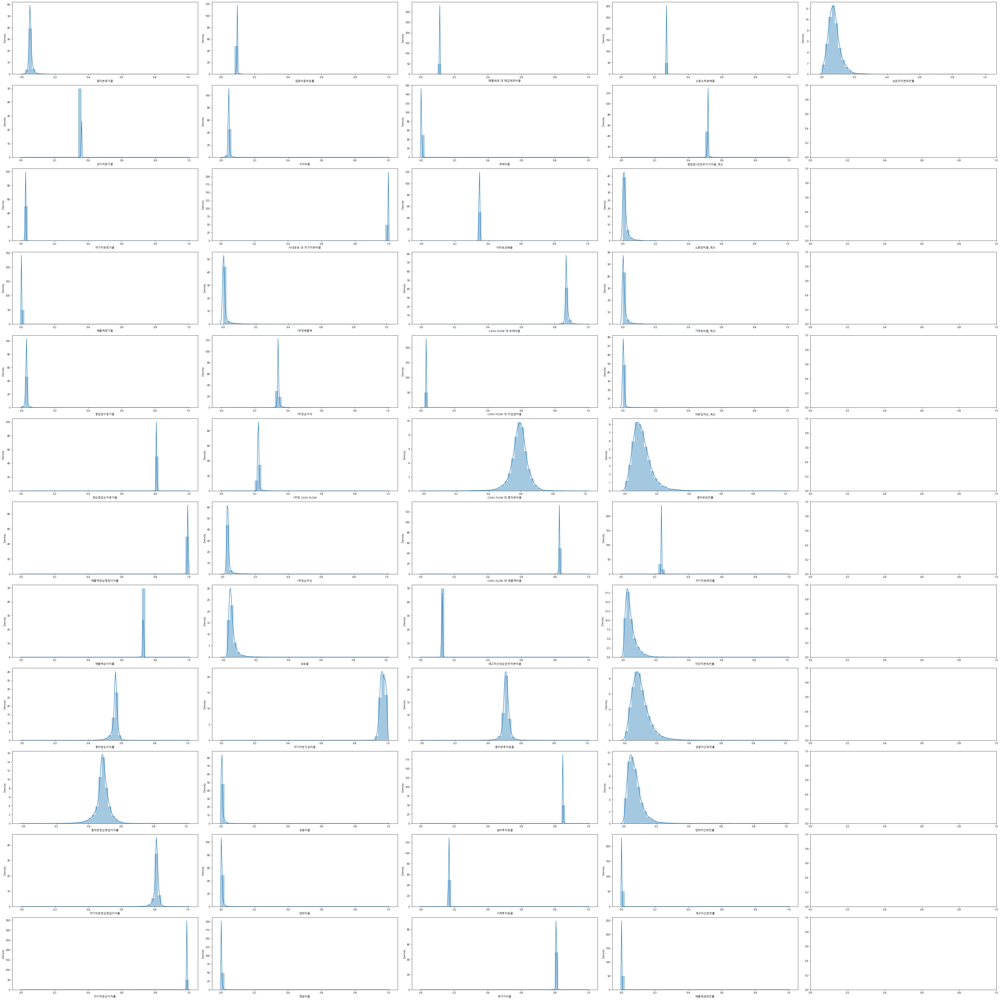

In [43]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(mmscaled_df_part5, axs.T.ravel()):
    sns.distplot(mmscaled_df_part5[col], ax=ax)

plt.show()

### MinMaxScaler 박스플롯

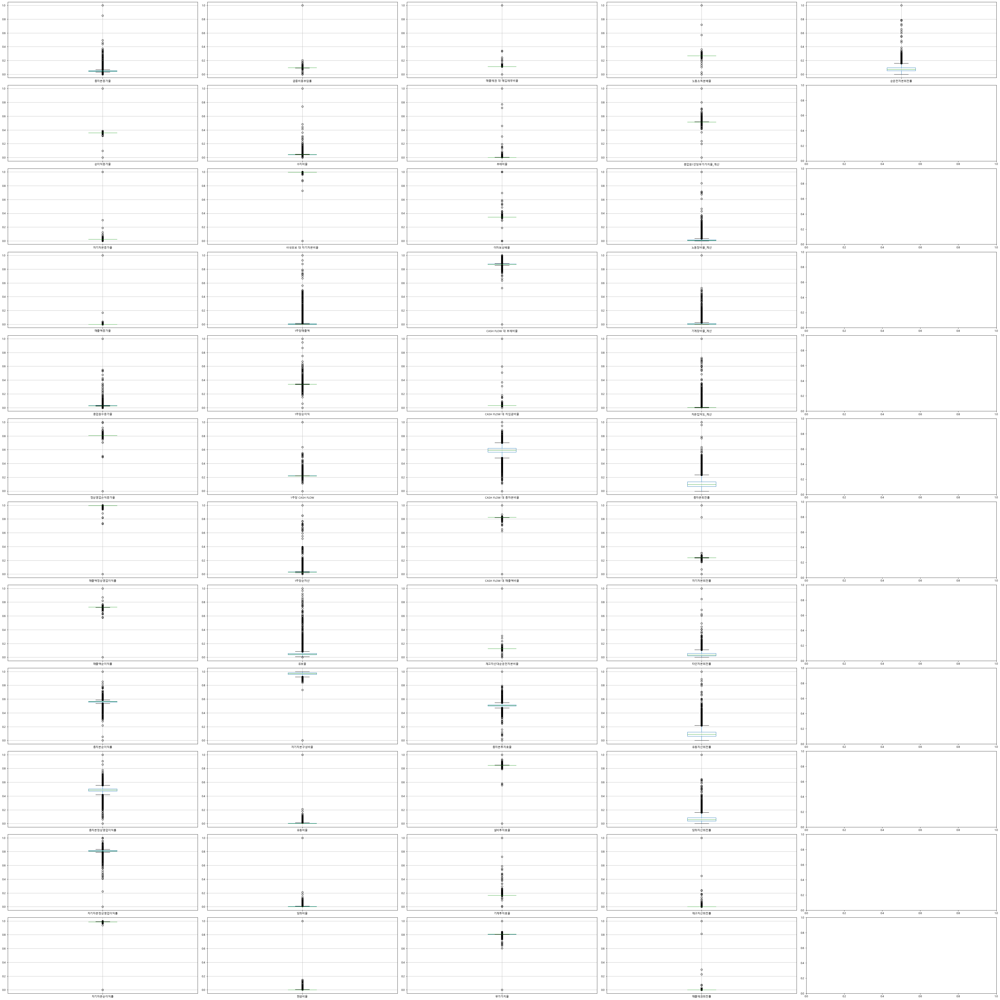

In [44]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(mmscaled_df_part5, axs.T.ravel()):
    mmscaled_df_part5[[col]].boxplot(ax=ax)

plt.show()

### MinMaxScaler Q-Q Plot

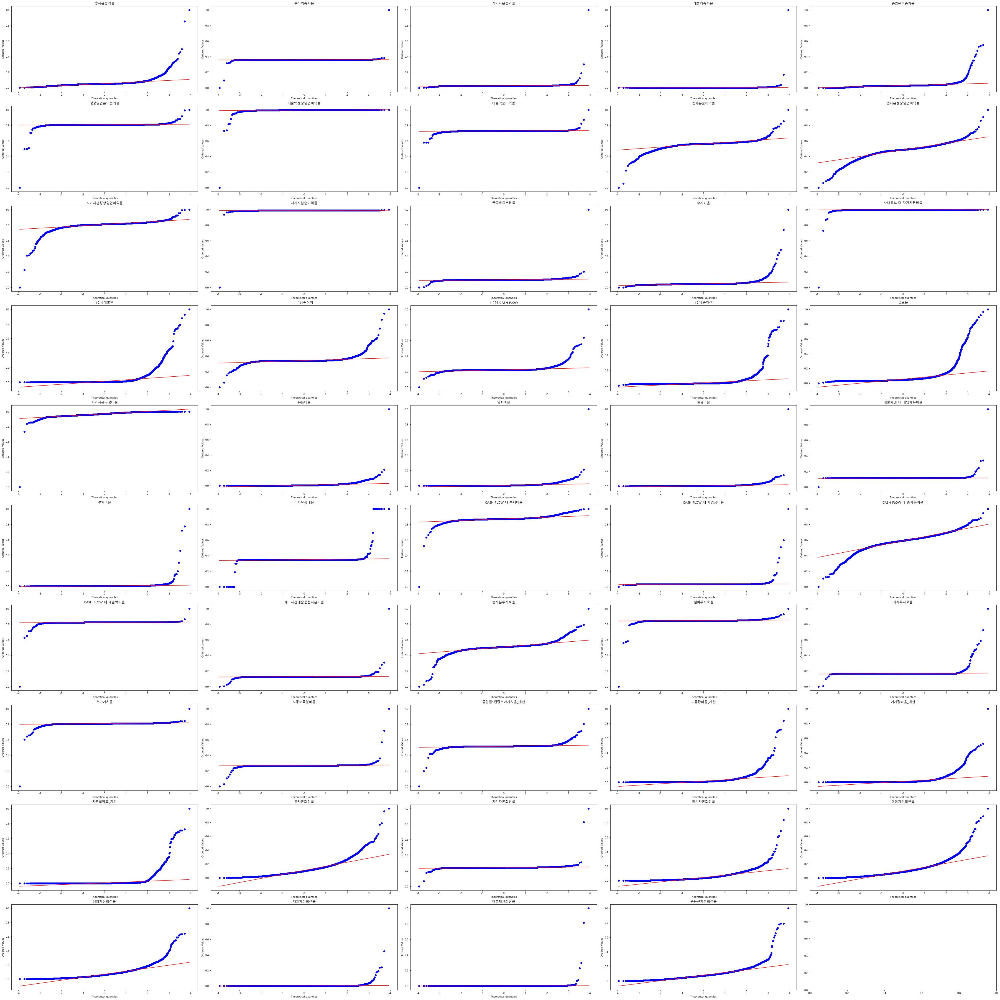

In [45]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), mmscaled_df_part5):
       stats.probplot(mmscaled_df_part5[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

### MinMaxScaler K-S Test

In [46]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [47]:
ks_test(mmscaled_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### MinMaxScaler Shapiro–Wilk test

In [48]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [49]:
# 컬럼별 pvalue 값 출력
shap_pct(mmscaled_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### MinMaxScaler 등분산, 이분산 확인

In [50]:
mmscaled_df_part5['부실기업'] = df_part5_final.iloc[:, 7]
mmscaled_df_part5.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,0.053236,0.358996,0.024943,0.001041,0.029168,0.810103,0.995637,0.727216,0.548773,0.480975,...,0.000586,0.077556,0.238812,0.033518,0.062563,0.037731,0.000008,0.000011,0.058030,0
1,0.099951,0.358946,0.026355,0.000609,0.027662,0.806761,0.993998,0.726154,0.530907,0.418503,...,0.001255,0.045828,0.238459,0.015418,0.026026,0.013875,0.000007,0.000008,0.028340,0
2,0.045808,0.359264,0.025950,0.000835,0.028285,0.809057,0.995652,0.727542,0.559458,0.476060,...,0.001213,0.042303,0.238300,0.020949,0.024024,0.012658,0.000007,0.000009,0.028340,0
3,0.048704,0.358981,0.024837,0.000742,0.033624,0.807940,0.995544,0.727517,0.559037,0.472919,...,0.001041,0.047004,0.238255,0.047595,0.034034,0.019474,0.000006,0.000008,0.037787,0
4,0.045540,0.358702,0.024747,0.000791,0.026505,0.806885,0.994907,0.727053,0.547389,0.446218,...,0.001066,0.055229,0.238362,0.048098,0.049550,0.029698,0.000006,0.000009,0.050607,0


In [51]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = mmscaled_df_part5.iloc[:, :-1]

nc_df = mmscaled_df_part5[mmscaled_df_part5['부실기업'] ==0]  # normal company 
bc_df = mmscaled_df_part5[mmscaled_df_part5['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.0 -> 등분산
**********************************************************
순이익증가율 pvalue 0.112 -> 이분산
**********************************************************
자기자본증가율 pvalue 0.001 -> 등분산
**********************************************************
매출액증가율 pvalue 0.79 -> 이분산
**********************************************************
종업원수증가율 pvalue 0.0 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.231 -> 이분산
**********************

In [52]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,이분산
자기자본증가율,등분산
매출액증가율,이분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [53]:
lev_sced_df.value_counts()

등분산성
등분산     33
이분산     16
dtype: int64

### MinMaxScaler Welch's ttest_ind

In [54]:
import numpy as np
from scipy.stats import ttest_ind

welch_df = mmscaled_df_part5.iloc[:, :-1]

nc_df = mmscaled_df_part5.iloc[:, :-1][mmscaled_df_part5['부실기업'] ==0]  # normal company 
bc_df = mmscaled_df_part5.iloc[:, :-1][mmscaled_df_part5['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [55]:
ttest_homo(nc_df, bc_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.025
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.423
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: 0.217
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
******************************************************

In [56]:
# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [57]:
ttest_hetero(nc_df, bc_df)

이분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순이익증가율 의 pvalue: 0.068
**********************************************************
이분산을 가정한 자기자본증가율 의 pvalue: 0.311
**********************************************************
이분산을 가정한 매출액증가율 의 pvalue: 0.012
**********************************************************
이분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 정상영업손익증가율 의 pvalue: 0.008
**********************************************************
이분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
****************************************************

### RobustScaler

In [58]:
from sklearn.preprocessing import RobustScaler

rbscaler = RobustScaler()
rbscaler.fit(df_part5_final.iloc[:, 10:])

rbscaled_df_part5 = rbscaler.transform(df_part5_final.iloc[:, 10:])

rbscaled_df_part5 = pd.DataFrame(rbscaled_df_part5, columns=df_part5_final.iloc[:, 10:].columns)

In [59]:
rbscaled_df_part5

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
0,0.511143,0.613771,0.003988,2.323833,0.318979,12.114867,-0.037037,-1.217535,-1.032637,-0.154179,...,0.145794,-0.601475,-0.275862,-0.319940,-0.052885,-0.409449,-0.407767,-0.146759,-0.761519,-0.307692
1,6.111277,-2.557752,4.351163,-0.504281,-0.110845,-7.262448,-3.676543,-4.798456,-2.364230,-1.930836,...,0.121299,-0.334074,-0.741379,-0.532615,-0.572115,-0.984252,-0.883495,-0.212500,-0.883038,-0.984615
2,-0.379215,17.667775,3.103881,0.976355,0.066986,6.050261,-0.003704,-0.120210,-0.236292,-0.293948,...,0.100974,-0.350762,-0.793103,-0.628743,-0.413462,-1.015748,-0.907767,-0.242130,-0.838481,-0.984615
3,-0.032114,-0.340435,-0.319726,0.366049,1.590112,-0.428113,-0.243210,-0.204025,-0.267624,-0.383285,...,0.373611,-0.419723,-0.724138,-0.655872,0.350962,-0.858268,-0.771845,-0.299537,-0.881013,-0.769231
4,-0.411361,-18.105485,-0.598877,0.685890,-0.440989,-6.540347,-1.656790,-1.768955,-1.135770,-1.142651,...,0.321835,-0.409647,-0.603448,-0.591169,0.365385,-0.614173,-0.567961,-0.257870,-0.832405,-0.476923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16629,0.972969,-1.969200,0.376567,-0.205564,1.213716,-0.698035,-0.395062,-0.507306,-0.560052,-0.399135,...,-0.272811,0.361348,0.224138,2.347442,-0.442308,4.102362,2.703883,4.487500,3.854177,1.738462
16630,-0.924058,-2.455669,-2.761311,-0.111995,-0.229665,-3.094524,-0.676543,-1.249518,-1.365535,-0.704611,...,-0.272811,0.246555,0.189655,2.251215,-0.480769,4.653543,3.354369,3.341204,3.416709,1.584615
16631,-0.568135,-0.123162,-2.645822,-0.567174,-1.133971,-1.798621,-1.098765,-1.546181,-1.671018,-1.151297,...,-0.272811,0.340530,0.155172,1.983898,-0.524038,3.905512,2.791262,2.857870,2.620759,1.061538
16632,-2.963043,0.315871,-3.908142,-3.907930,-4.629984,0.638298,-1.976543,-5.824097,-1.390339,-0.783862,...,-0.272811,0.530141,-1.120690,2.537405,-0.932692,-0.598425,-0.597087,-0.028241,-0.289620,-1.200000


### RobustScaler 히스토그램

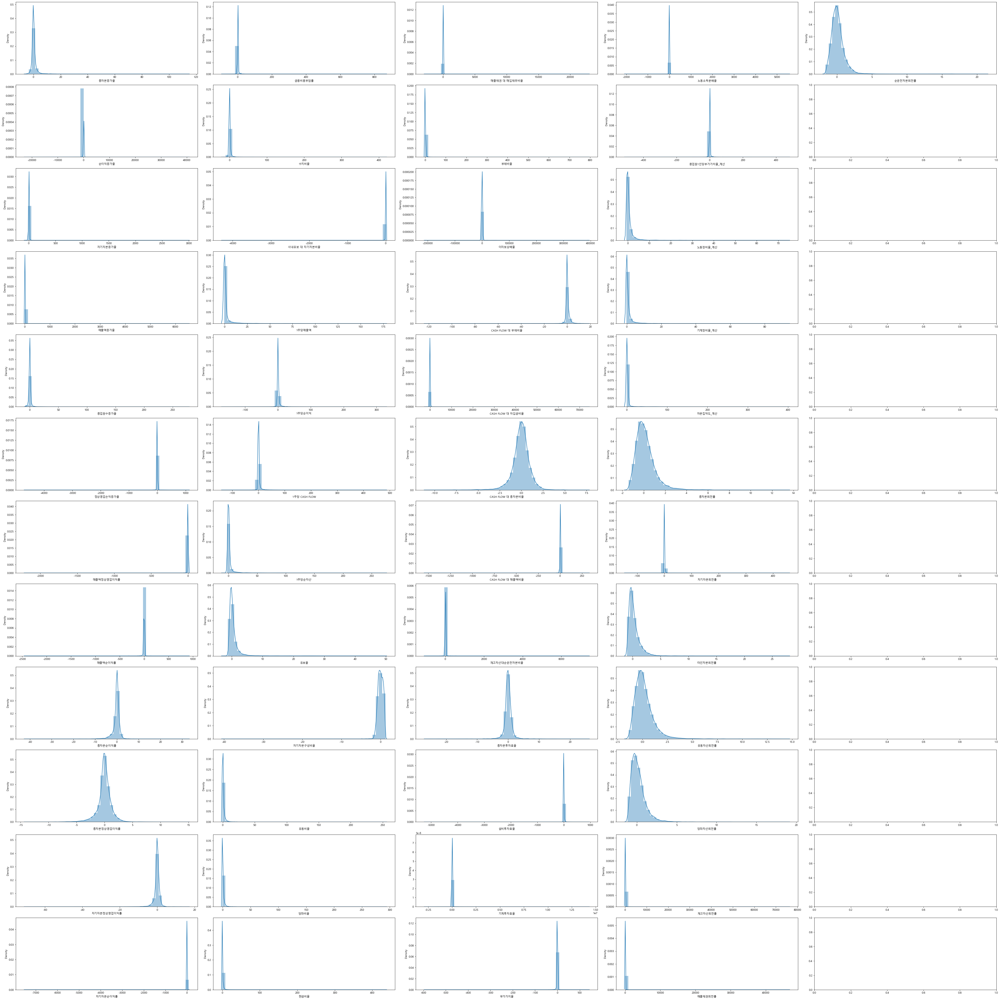

In [60]:
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(rbscaled_df_part5, axs.T.ravel()):
    sns.distplot(rbscaled_df_part5[col], ax=ax)

plt.show()

### RobustScaler 박스플롯

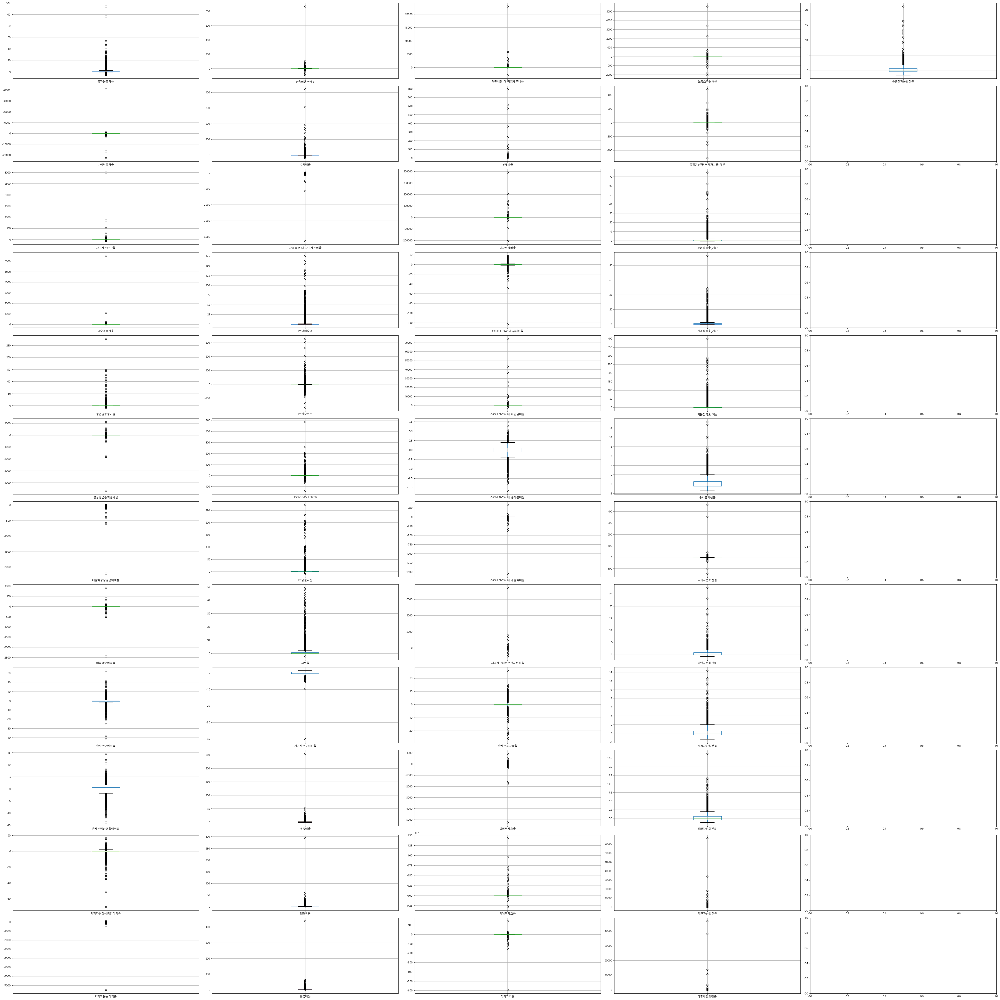

In [61]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(rbscaled_df_part5, axs.T.ravel()):
    rbscaled_df_part5[[col]].boxplot(ax=ax)

plt.show()

### RobustScaler Q-Q Plot

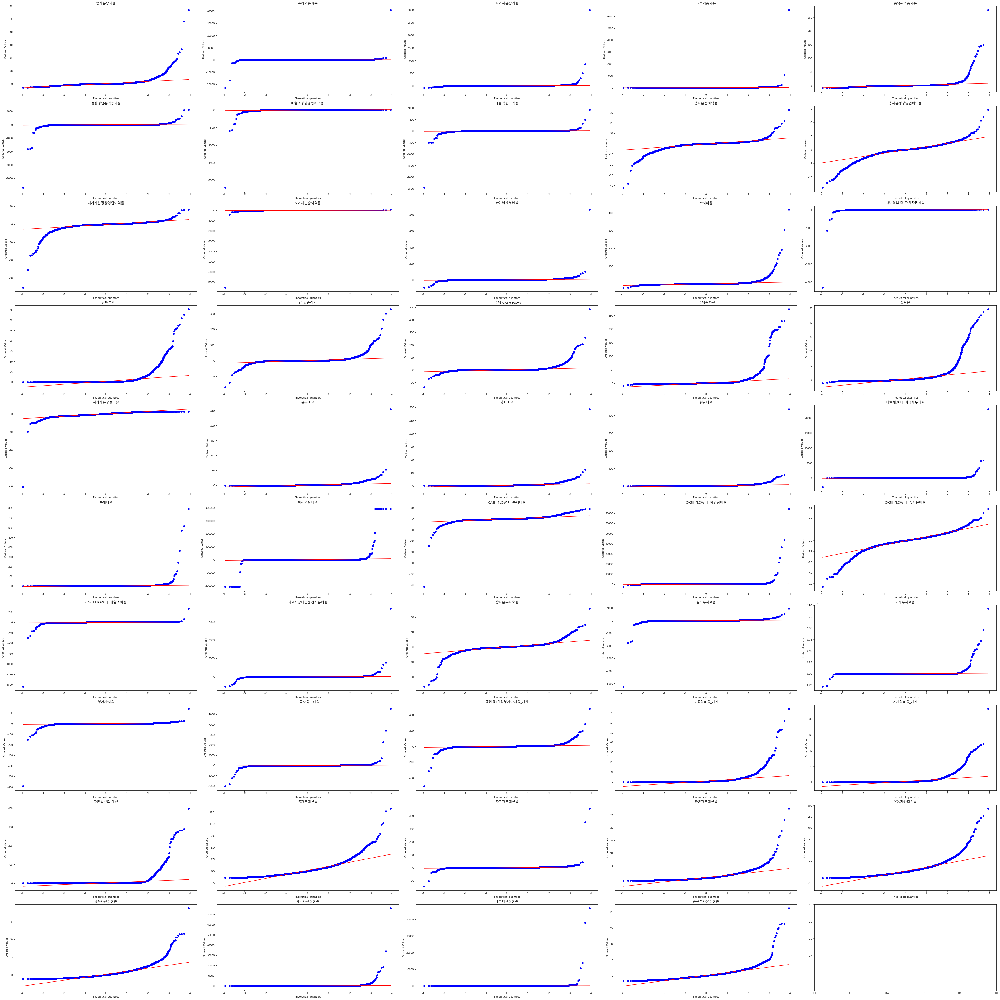

In [62]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), rbscaled_df_part5):
       stats.probplot(rbscaled_df_part5[i], dist=stats.norm, plot=ax)
       ax.set_title(str(i))

plt.show()

### RobustScaler K-S Test

In [63]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [64]:
ks_test(rbscaled_df_part5)

총자본증가율 의 pvalue: 3.288373623290156e-138
순이익증가율 의 pvalue: 1.2563324879786344e-76
자기자본증가율 의 pvalue: 6.983886603239312e-122
매출액증가율 의 pvalue: 1.0785458254782586e-66
종업원수증가율 의 pvalue: 2.3161986527623286e-103
정상영업손익증가율 의 pvalue: 3.42525899525228e-70
매출액정상영업이익률 의 pvalue: 7.2037088955936654e-96
매출액순이익률 의 pvalue: 2.403969895373875e-125
총자본순이익률 의 pvalue: 6.074812622686049e-76
총자본정상영업이익률 의 pvalue: 4.2043698615121795e-84
자기자본정상영업이익률 의 pvalue: 3.2598198486382715e-89
자기자본순이익률 의 pvalue: 3.417219086957344e-115
금융비용부담률 의 pvalue: 8.496010157140733e-201
수지비율 의 pvalue: 1.2161858778892417e-89
사내유보 대 자기자본비율 의 pvalue: 1.7333676572231518e-203
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 2.6884550527151618e-199
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 4.1881104513546215e-216
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총

### RobustScaler Shapiro–Wilk test

In [65]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [66]:
# 컬럼별 pvalue 값 출력
shap_pct(rbscaled_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### RobustScaler 등분산, 이분산 확인

In [67]:
rbscaled_df_part5['부실기업'] = df_part5_final.iloc[:, 7]
rbscaled_df_part5.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,0.511143,0.613771,0.003988,2.323833,0.318979,12.114867,-0.037037,-1.217535,-1.032637,-0.154179,...,-0.601475,-0.275862,-0.319940,-0.052885,-0.409449,-0.407767,-0.146759,-0.761519,-0.307692,0
1,6.111277,-2.557752,4.351163,-0.504281,-0.110845,-7.262448,-3.676543,-4.798456,-2.364230,-1.930836,...,-0.334074,-0.741379,-0.532615,-0.572115,-0.984252,-0.883495,-0.212500,-0.883038,-0.984615,0
2,-0.379215,17.667775,3.103881,0.976355,0.066986,6.050261,-0.003704,-0.120210,-0.236292,-0.293948,...,-0.350762,-0.793103,-0.628743,-0.413462,-1.015748,-0.907767,-0.242130,-0.838481,-0.984615,0
3,-0.032114,-0.340435,-0.319726,0.366049,1.590112,-0.428113,-0.243210,-0.204025,-0.267624,-0.383285,...,-0.419723,-0.724138,-0.655872,0.350962,-0.858268,-0.771845,-0.299537,-0.881013,-0.769231,0
4,-0.411361,-18.105485,-0.598877,0.685890,-0.440989,-6.540347,-1.656790,-1.768955,-1.135770,-1.142651,...,-0.409647,-0.603448,-0.591169,0.365385,-0.614173,-0.567961,-0.257870,-0.832405,-0.476923,0


In [68]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = rbscaled_df_part5.iloc[:, :-1]

nc_df = rbscaled_df_part5[rbscaled_df_part5['부실기업'] ==0]  # normal company 
bc_df = rbscaled_df_part5[rbscaled_df_part5['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.0 -> 등분산
**********************************************************
순이익증가율 pvalue 0.112 -> 이분산
**********************************************************
자기자본증가율 pvalue 0.001 -> 등분산
**********************************************************
매출액증가율 pvalue 0.79 -> 이분산
**********************************************************
종업원수증가율 pvalue 0.0 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.231 -> 이분산
**********************

In [69]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,이분산
자기자본증가율,등분산
매출액증가율,이분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [70]:
lev_sced_df.value_counts()

등분산성
등분산     33
이분산     16
dtype: int64

### RobustScaler Welch's ttest_ind

In [71]:
import numpy as np
from scipy.stats import ttest_ind

welch_df = rbscaled_df_part5.iloc[:, :-1]

nc_df = rbscaled_df_part5.iloc[:, :-1][rbscaled_df_part5['부실기업'] ==0]  # normal company 
bc_df = rbscaled_df_part5.iloc[:, :-1][rbscaled_df_part5['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [72]:
ttest_homo(nc_df, bc_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.025
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.423
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: 0.217
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
******************************************************

In [73]:
# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [74]:
ttest_hetero(nc_df, bc_df)

이분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순이익증가율 의 pvalue: 0.068
**********************************************************
이분산을 가정한 자기자본증가율 의 pvalue: 0.311
**********************************************************
이분산을 가정한 매출액증가율 의 pvalue: 0.012
**********************************************************
이분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 정상영업손익증가율 의 pvalue: 0.008
**********************************************************
이분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
****************************************************

## 이상치 제거 후 정규성 검정

### IQR

In [75]:
# 이상치 인덱스 확인

q1 = df_part5_final['총자본증가율'].quantile(0.25)
q3 = df_part5_final['총자본증가율'].quantile(0.75)
iqr = q3-q1

condition1 = df_part5_final['총자본증가율']>q3+1.5*iqr
condition2 = df_part5_final['총자본증가율']<q1-1.5*iqr
a = df_part5_final[condition1].index
b = df_part5_final[condition2].index

print(a)
print(b)

Int64Index([    1,     5,     8,    25,    28,    29,    46,    67,   100,
              130,
            ...
            16429, 16437, 16478, 16590, 16599, 16600, 16603, 16607, 16608,
            16610],
           dtype='int64', length=1288)
Int64Index([   10,    37,    43,    90,    92,    95,   104,   137,   138,
              146,
            ...
            16331, 16393, 16500, 16519, 16593, 16597, 16601, 16624, 16632,
            16633],
           dtype='int64', length=517)


In [76]:
iqr_list = ['총자본증가율', '순이익증가율', '자기자본증가율', '매출액증가율', '종업원수증가율',
       '정상영업손익증가율', '매출액정상영업이익률', '매출액순이익률', '총자본순이익률', '총자본정상영업이익률',
       '자기자본정상영업이익률', '자기자본순이익률', '금융비용부담률', '수지비율', '사내유보 대 자기자본비율', '1주당매출액',
       '1주당순이익', '1주당 CASH FLOW', '1주당순자산', '유보율', '자기자본구성비율', '유동비율', '당좌비율',
       '현금비율', '매출채권 대 매입채무비율', '부채비율', '이자보상배율', 'CASH FLOW 대 부채비율',
       'CASH FLOW 대 차입금비율', 'CASH FLOW 대 총자본비율', 'CASH FLOW 대 매출액비율',
       '재고자산대순운전자본비율', '총자본투자효율', '설비투자효율', '기계투자효율', '부가가치율', '노동소득분배율',
       '종업원1인당부가가치율_계산', '노동장비율_계산', '기계장비율_계산', '자본집약도_계산', '총자본회전률',
       '자기자본회전률', '타인자본회전률', '유동자산회전률', '당좌자산회전률', '재고자산회전률', '매출채권회전률',
       '순운전자본회전률']

In [77]:
cols = []

iqr_df = df_part5_final[iqr_list]
cols.append([col for col in iqr_df])

Q1 = iqr_df[iqr_list].quantile(q=0.25)
Q3 = iqr_df[iqr_list].quantile(q=0.75)
IQR = Q3-Q1

for i in cols:
       iqr_df[i] = iqr_df[i][(iqr_df[i] <= Q3[i]+1.5*IQR[i]) & (iqr_df[i] >= Q1[i]-1.5*IQR[i])]

### IQR 히스토그램

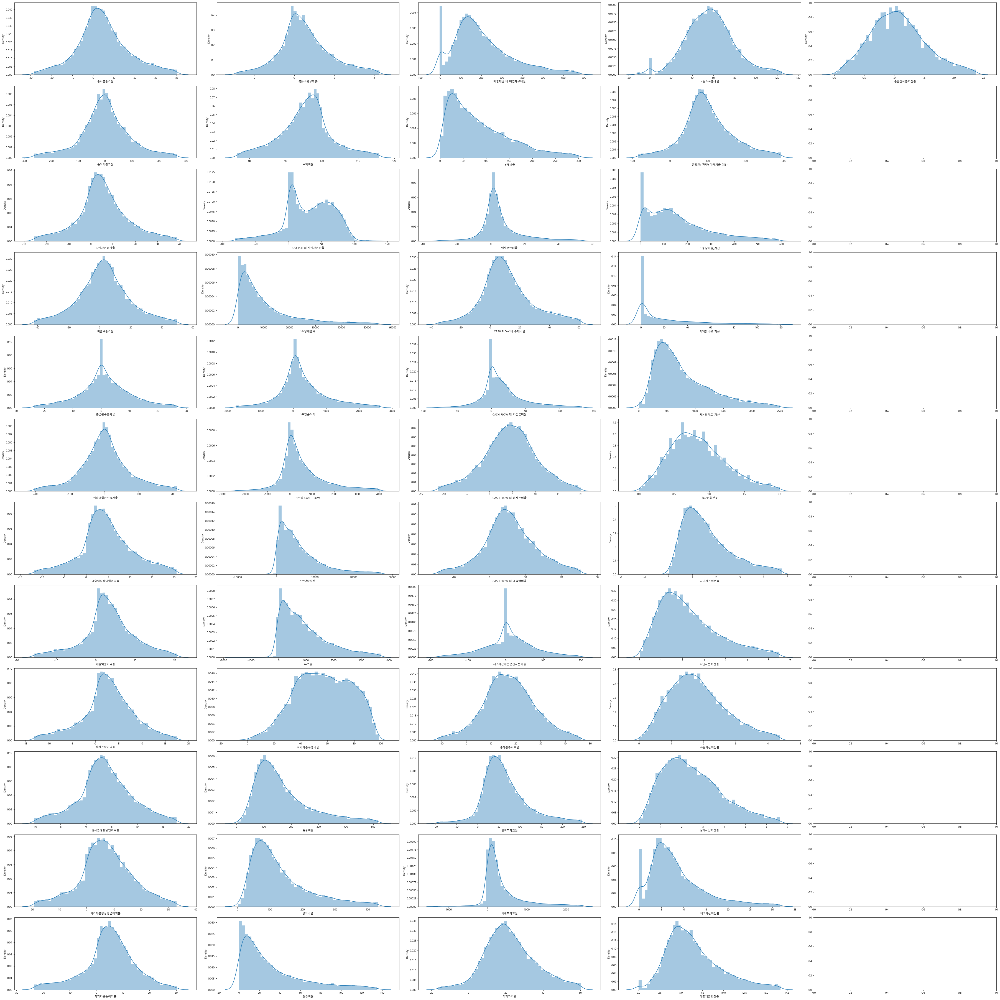

In [78]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(iqr_df, axs.T.ravel()):
    sns.distplot(iqr_df[col], ax=ax)

plt.show()

### IQR 박스플롯

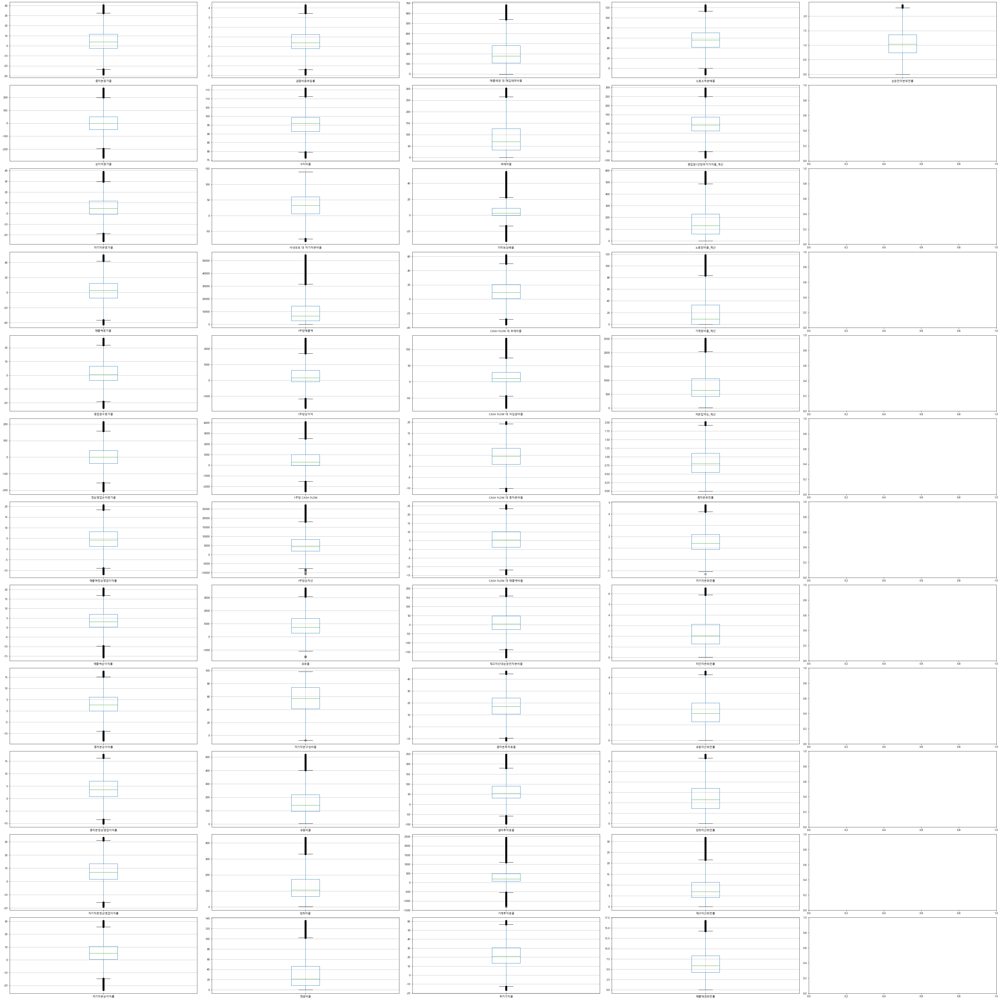

In [79]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(iqr_df.columns, axs.T.ravel()):
    iqr_df[[col]].boxplot(ax=ax)

plt.show()

### IQR Q-Q Plot

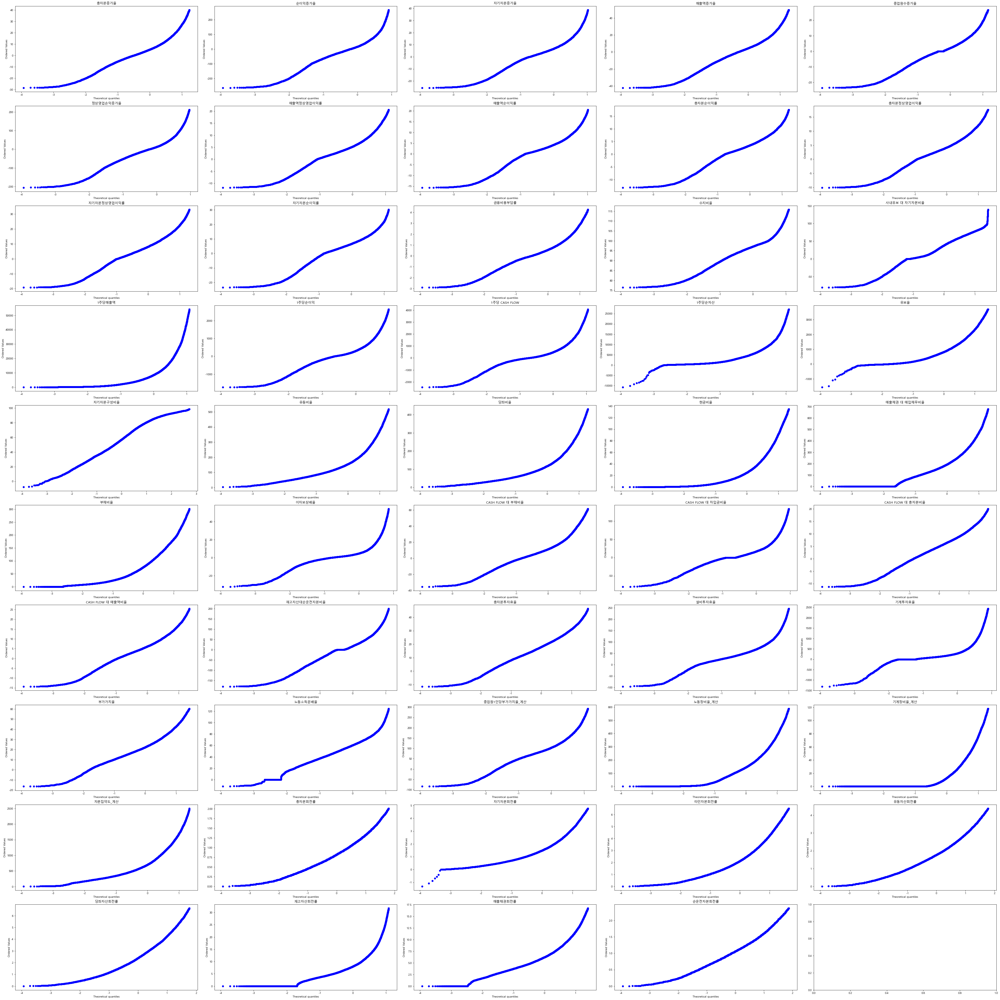

In [80]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), iqr_df):
        stats.probplot(iqr_df[i], dist='norm', plot=ax)
        ax.set_title(str(i))

plt.show()

### IQR K-S Test

In [81]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [82]:
ks_test(iqr_df)

총자본증가율 의 pvalue: nan
순이익증가율 의 pvalue: nan
자기자본증가율 의 pvalue: nan
매출액증가율 의 pvalue: nan
종업원수증가율 의 pvalue: nan
정상영업손익증가율 의 pvalue: nan
매출액정상영업이익률 의 pvalue: nan
매출액순이익률 의 pvalue: nan
총자본순이익률 의 pvalue: nan
총자본정상영업이익률 의 pvalue: nan
자기자본정상영업이익률 의 pvalue: nan
자기자본순이익률 의 pvalue: nan
금융비용부담률 의 pvalue: nan
수지비율 의 pvalue: nan
사내유보 대 자기자본비율 의 pvalue: nan
1주당매출액 의 pvalue: nan
1주당순이익 의 pvalue: nan
1주당 CASH FLOW 의 pvalue: nan
1주당순자산 의 pvalue: nan
유보율 의 pvalue: nan
자기자본구성비율 의 pvalue: nan
유동비율 의 pvalue: nan
당좌비율 의 pvalue: nan
현금비율 의 pvalue: nan
매출채권 대 매입채무비율 의 pvalue: nan
부채비율 의 pvalue: nan
이자보상배율 의 pvalue: nan
CASH FLOW 대 부채비율 의 pvalue: nan
CASH FLOW 대 차입금비율 의 pvalue: nan
CASH FLOW 대 총자본비율 의 pvalue: nan
CASH FLOW 대 매출액비율 의 pvalue: nan
재고자산대순운전자본비율 의 pvalue: nan
총자본투자효율 의 pvalue: nan
설비투자효율 의 pvalue: nan
기계투자효율 의 pvalue: nan
부가가치율 의 pvalue: nan
노동소득분배율 의 pvalue: nan
종업원1인당부가가치율_계산 의 pvalue: nan
노동장비율_계산 의 pvalue: nan
기계장비율_계산 의 pvalue: nan
자본집약도_계산 의 pvalue: nan
총자본회전률 의 pvalue: nan
자기자본회전률 의 pvalue: nan

### IQR Shapiro–Wilk test

In [83]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [84]:
# 컬럼별 pvalue 값 출력
shap_pct(iqr_df)

총자본증가율 의 pvalue: 1.0
순이익증가율 의 pvalue: 1.0
자기자본증가율 의 pvalue: 1.0
매출액증가율 의 pvalue: 1.0
종업원수증가율 의 pvalue: 1.0
정상영업손익증가율 의 pvalue: 1.0
매출액정상영업이익률 의 pvalue: 1.0
매출액순이익률 의 pvalue: 1.0
총자본순이익률 의 pvalue: 1.0
총자본정상영업이익률 의 pvalue: 1.0
자기자본정상영업이익률 의 pvalue: 1.0
자기자본순이익률 의 pvalue: 1.0
금융비용부담률 의 pvalue: 1.0
수지비율 의 pvalue: 1.0
사내유보 대 자기자본비율 의 pvalue: 1.0
1주당매출액 의 pvalue: 1.0
1주당순이익 의 pvalue: 1.0
1주당 CASH FLOW 의 pvalue: 1.0
1주당순자산 의 pvalue: 1.0
유보율 의 pvalue: 1.0
자기자본구성비율 의 pvalue: 1.0
유동비율 의 pvalue: 1.0
당좌비율 의 pvalue: 1.0
현금비율 의 pvalue: 1.0
매출채권 대 매입채무비율 의 pvalue: 1.0
부채비율 의 pvalue: 1.0
이자보상배율 의 pvalue: 1.0
CASH FLOW 대 부채비율 의 pvalue: 1.0
CASH FLOW 대 차입금비율 의 pvalue: 1.0
CASH FLOW 대 총자본비율 의 pvalue: 1.0
CASH FLOW 대 매출액비율 의 pvalue: 1.0
재고자산대순운전자본비율 의 pvalue: 1.0
총자본투자효율 의 pvalue: 1.0
설비투자효율 의 pvalue: 1.0
기계투자효율 의 pvalue: 1.0
부가가치율 의 pvalue: 1.0
노동소득분배율 의 pvalue: 1.0
종업원1인당부가가치율_계산 의 pvalue: 1.0
노동장비율_계산 의 pvalue: 1.0
기계장비율_계산 의 pvalue: 1.0
자본집약도_계산 의 pvalue: 1.0
총자본회전률 의 pvalue: 1.0
자기자본회전률 의 pvalue: 1.0

### IQR 등분산, 이분산 확인

In [85]:
iqr_df['부실기업'] = df_part5_final.iloc[:, 7]
iqr_df.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,13.166482,80.280163,5.219839,NaN,4.65,NaN,3.61,-8.50,-5.58,2.37,...,204.066667,0.66,0.984333,2.01,1.25,1.55,6.42,2.45,0.86,0
1,NaN,NaN,NaN,-8.429134,-0.74,NaN,NaN,NaN,NaN,-9.96,...,425.291045,0.39,0.655130,0.93,0.52,0.57,5.71,1.85,0.42,0
2,-2.093352,NaN,NaN,25.510008,1.49,NaN,3.88,1.45,0.52,1.40,...,411.485294,0.36,0.506332,1.26,0.48,0.52,5.39,2.07,0.42,0
3,3.855597,-46.641074,0.010946,11.520576,20.59,-44.098325,1.94,0.69,0.28,0.78,...,354.432927,0.40,0.464339,2.85,0.68,0.80,4.77,1.86,0.56,0
4,-2.644307,NaN,-4.480893,18.851969,-4.88,NaN,-9.51,-13.50,-6.37,-4.49,...,362.769231,0.47,0.564493,2.88,0.99,1.22,5.22,2.10,0.75,0


In [86]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = iqr_df.iloc[:, :-1]

nc_df = iqr_df[iqr_df['부실기업'] ==0]  # normal company 
bc_df = iqr_df[iqr_df['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue nan -> 이분산
**********************************************************
순이익증가율 pvalue nan -> 이분산
**********************************************************
자기자본증가율 pvalue nan -> 이분산
**********************************************************
매출액증가율 pvalue nan -> 이분산
**********************************************************
종업원수증가율 pvalue nan -> 이분산
**********************************************************
정상영업손익증가율 pvalue nan -> 이분산
**********************************************************
매출액정상영업이익률 pvalue nan -> 이분산
**********************************************************
매출액순이익률 pvalue nan -> 이분산
**********************************************************
총자본순이익률 pvalue nan -> 이분산
**********************************************************
총자본정상영업이익률 pvalue nan -> 이분산
**********************************************************
자기자본정상영업이익률 pvalue nan -> 이분산
**********************************************************
자기자본순이익률 pvalue nan -> 이분산
*****************************

In [87]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,이분산
순이익증가율,이분산
자기자본증가율,이분산
매출액증가율,이분산
종업원수증가율,이분산
정상영업손익증가율,이분산
매출액정상영업이익률,이분산
매출액순이익률,이분산
총자본순이익률,이분산
총자본정상영업이익률,이분산


In [88]:
lev_sced_df.value_counts()

등분산성
이분산     49
dtype: int64

### IQR Welch's ttest_ind

In [89]:
import numpy as np
from scipy.stats import ttest_ind

welch_df = iqr_df.iloc[:, :-1]

nc_df = iqr_df.iloc[:, :-1][iqr_df['부실기업'] ==0]  # normal company 
bc_df = iqr_df.iloc[:, :-1][iqr_df['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [90]:
ttest_homo(nc_df, bc_df)

등분산을 가정한 총자본증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: nan
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: nan
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: nan
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: nan
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: nan
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: nan
**********************************************************
등

In [91]:
# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [92]:
ttest_hetero(nc_df, bc_df)

이분산을 가정한 총자본증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 순이익증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 자기자본증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 매출액증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 종업원수증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 정상영업손익증가율 의 pvalue: nan
**********************************************************
이분산을 가정한 매출액정상영업이익률 의 pvalue: nan
**********************************************************
이분산을 가정한 매출액순이익률 의 pvalue: nan
**********************************************************
이분산을 가정한 총자본순이익률 의 pvalue: nan
**********************************************************
이분산을 가정한 총자본정상영업이익률 의 pvalue: nan
**********************************************************
이분산을 가정한 자기자본정상영업이익률 의 pvalue: nan
**********************************************************
이

## 윈저라이징

In [93]:
wins_df_part5 = df_part5_final.copy()

In [94]:
# 윈저라이징 할 컬럼 데이터프레임
wins_df_part5 = wins_df_part5.iloc[:, 10:]

In [95]:
from scipy.stats.mstats import winsorize

# 윈저라이징 함수 생성
def winsorize_col(winsordf, col):
    winsordf[col] = winsorize(winsordf[col], limits=[0.025, 0.025])

In [96]:
# 윈저라이징 적용
for i in wins_df_part5.columns:
    winsorize_col(wins_df_part5, i)

### 윈저라이징 후 히스토그램

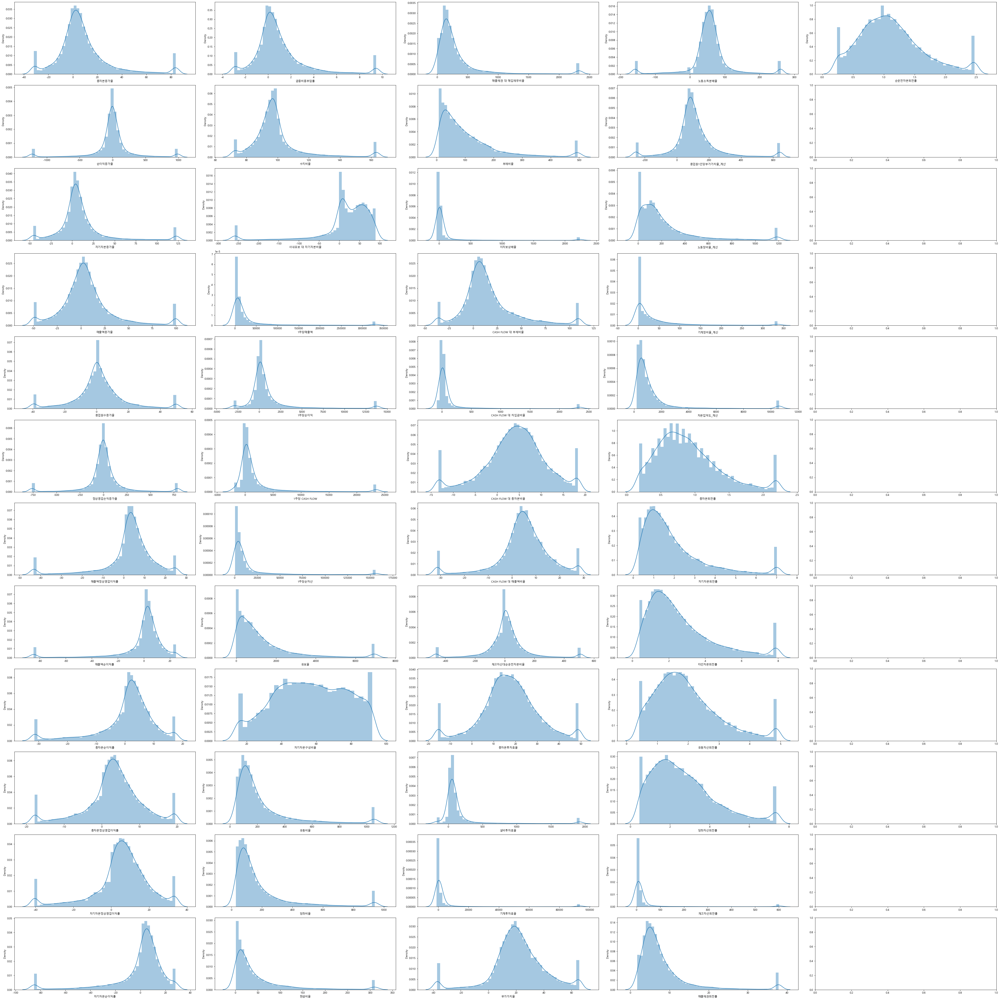

In [97]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(wins_df_part5, axs.T.ravel()):
    sns.distplot(wins_df_part5[col], ax=ax)

plt.show()

### 윈저라이징 후 박스플롯

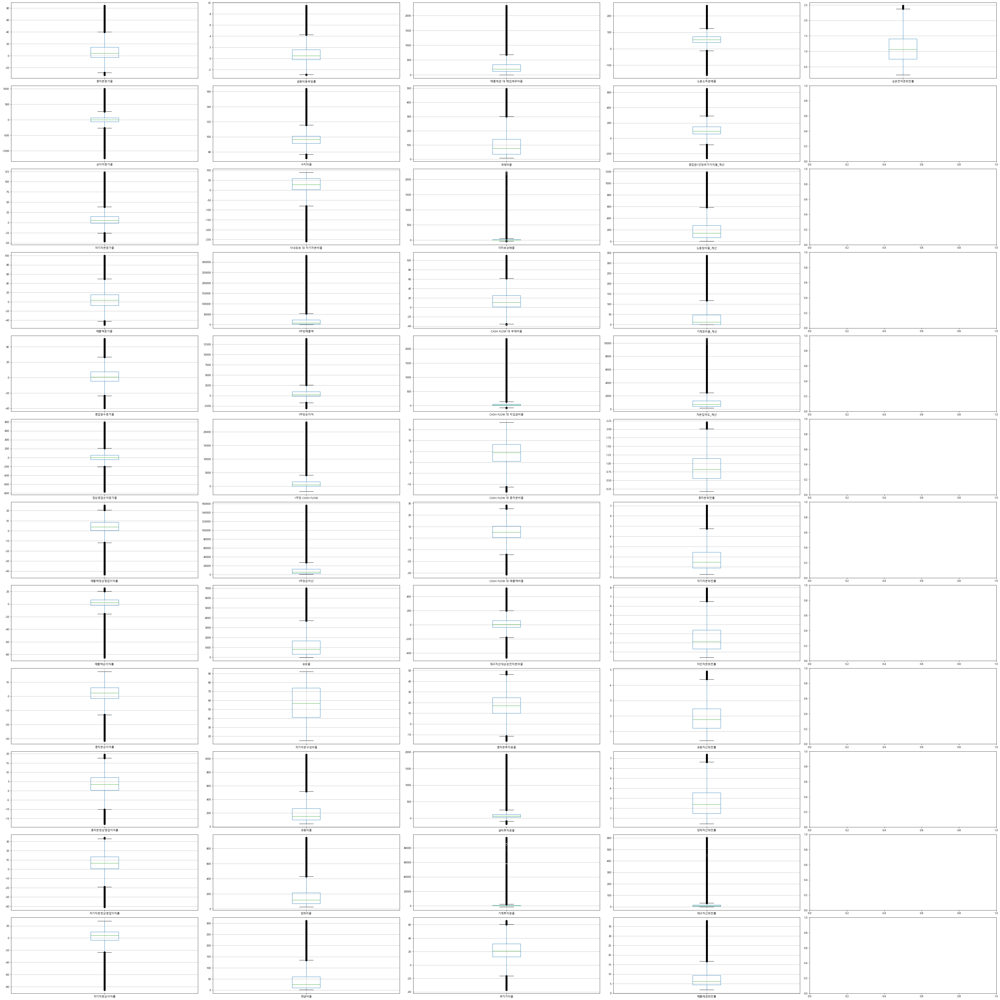

In [98]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 12

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for col, ax in zip(wins_df_part5.columns, axs.T.ravel()):
    wins_df_part5[[col]].boxplot(ax=ax)

plt.show()

### 윈저라이징 후 Q-Q Plot

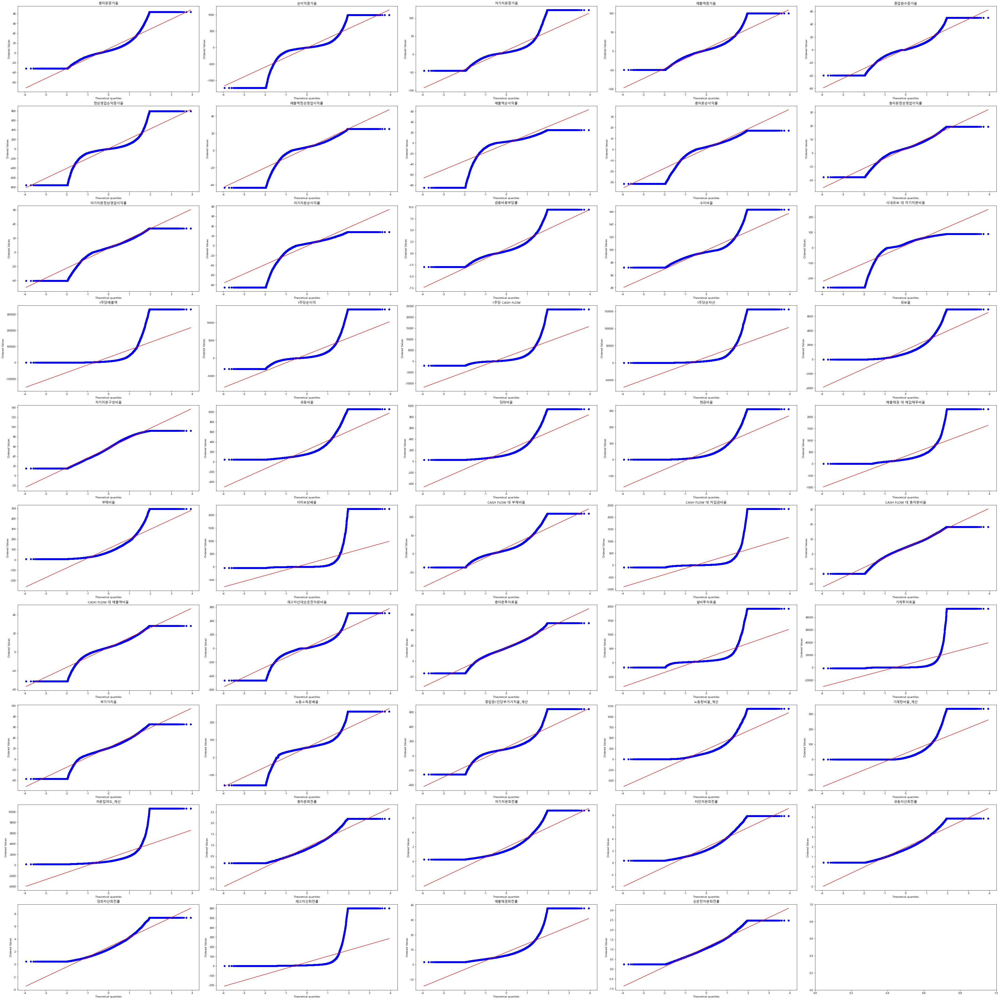

In [99]:
from scipy import stats

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

ncols = 5
nrows = 10

fig, axs = plt.subplots(nrows, ncols, constrained_layout=True)
fig.set_size_inches((50, 50))

for ax, i in zip(axs.ravel(), wins_df_part5):
        stats.probplot(wins_df_part5[i], dist='norm', plot=ax)
        ax.set_title(str(i))

plt.show()

### 윈저라이징 K-S Test

In [100]:
import numpy as np
from scipy.stats import kstest

def ks_test(df_name):
    ks_columns = []
    ks_columns.append([col for col in df_name])
    for i in ks_columns:
        for j in i:
            ks_test = kstest(df_name[j], 'norm')
            print(j, "의 pvalue:", ks_test.pvalue)

In [101]:
ks_test(wins_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 0.0
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 0.0
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회전률 의 pvalue: 0.0
자기자본회전률 의 pvalue: 0.0

### 윈저라이징 Shapiro–Wilk test

In [102]:
# pvalue 함수

from scipy import stats
from scipy.stats import shapiro

# 등락률 컬럼만 추출해서 pvalue 구하는 함수
def shap_pct(df_name):
    pct_columns = []
    pct_columns.append([col for col in df_name])
    for i in pct_columns:
        for j in i:
            shapiro_test = shapiro(df_name[j])
            print(j, "의 pvalue:", shapiro_test.pvalue)

In [103]:
# 컬럼별 pvalue 값 출력
shap_pct(wins_df_part5)

총자본증가율 의 pvalue: 0.0
순이익증가율 의 pvalue: 0.0
자기자본증가율 의 pvalue: 0.0
매출액증가율 의 pvalue: 0.0
종업원수증가율 의 pvalue: 0.0
정상영업손익증가율 의 pvalue: 0.0
매출액정상영업이익률 의 pvalue: 0.0
매출액순이익률 의 pvalue: 0.0
총자본순이익률 의 pvalue: 0.0
총자본정상영업이익률 의 pvalue: 0.0
자기자본정상영업이익률 의 pvalue: 0.0
자기자본순이익률 의 pvalue: 0.0
금융비용부담률 의 pvalue: 0.0
수지비율 의 pvalue: 0.0
사내유보 대 자기자본비율 의 pvalue: 0.0
1주당매출액 의 pvalue: 0.0
1주당순이익 의 pvalue: 0.0
1주당 CASH FLOW 의 pvalue: 0.0
1주당순자산 의 pvalue: 0.0
유보율 의 pvalue: 0.0
자기자본구성비율 의 pvalue: 0.0
유동비율 의 pvalue: 0.0
당좌비율 의 pvalue: 0.0
현금비율 의 pvalue: 0.0
매출채권 대 매입채무비율 의 pvalue: 0.0
부채비율 의 pvalue: 0.0
이자보상배율 의 pvalue: 0.0
CASH FLOW 대 부채비율 의 pvalue: 0.0
CASH FLOW 대 차입금비율 의 pvalue: 0.0
CASH FLOW 대 총자본비율 의 pvalue: 4.1016006050787396e-42
CASH FLOW 대 매출액비율 의 pvalue: 0.0
재고자산대순운전자본비율 의 pvalue: 0.0
총자본투자효율 의 pvalue: 4.4309057441950716e-42
설비투자효율 의 pvalue: 0.0
기계투자효율 의 pvalue: 0.0
부가가치율 의 pvalue: 0.0
노동소득분배율 의 pvalue: 0.0
종업원1인당부가가치율_계산 의 pvalue: 0.0
노동장비율_계산 의 pvalue: 0.0
기계장비율_계산 의 pvalue: 0.0
자본집약도_계산 의 pvalue: 0.0
총자본회

### 윈저라이징 등분산, 이분산 확인

In [104]:
wins_df_part5['부실기업'] = df_part5_final.iloc[:, 7]
wins_df_part5.head(5)

,총자본증가율,순이익증가율,자기자본증가율,매출액증가율,종업원수증가율,정상영업손익증가율,매출액정상영업이익률,매출액순이익률,총자본순이익률,총자본정상영업이익률,...,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률,부실기업
0,13.166482,80.280163,5.219839,56.396905,4.65,790.705855,3.61,-8.50,-5.58,2.37,...,204.066667,0.66,0.984333,2.01,1.25,1.55,6.42,2.45,0.86,0
1,83.900297,-341.571868,75.170505,-8.429134,-0.74,-756.819406,-25.87,-40.97,-15.78,-9.96,...,425.291045,0.39,0.655130,0.93,0.52,0.57,5.71,1.85,0.42,0
2,-2.093352,989.742554,55.100407,25.510008,1.49,631.501169,3.88,1.45,0.52,1.40,...,411.485294,0.36,0.506332,1.26,0.48,0.52,5.39,2.07,0.42,0
3,3.855597,-46.641074,0.010946,11.520576,20.59,-44.098325,1.94,0.69,0.28,0.78,...,354.432927,0.40,0.464339,2.85,0.68,0.80,4.77,1.86,0.56,0
4,-2.644307,-1225.486100,-4.480893,18.851969,-4.88,-681.514824,-9.51,-13.50,-6.37,-4.49,...,362.769231,0.47,0.564493,2.88,0.99,1.22,5.22,2.10,0.75,0


In [105]:
# from scipy.stats import bartlett
from scipy.stats import levene

homosced = []
heterosced = []

lev_df = wins_df_part5.iloc[:, :-1]

nc_df = wins_df_part5[wins_df_part5['부실기업'] ==0]  # normal company 
bc_df = wins_df_part5[wins_df_part5['부실기업'] ==1]  # bankrupt company

lev_sced_df = pd.DataFrame(index=['등분산성'])

for i in lev_df.columns:
    lev_sced_df[i] = ''
    
    ser_1 = nc_df[i]
    ser_2 = bc_df[i]

    lresult = np.round(levene(ser_1, ser_2)[1], 3)
    
    if lresult < 0.05:
        homosced.append(i)
        lev_sced_df.loc['등분산성', i] = '등분산'
        print(i,"pvalue", lresult,"-> 등분산")
    else:
        heterosced.append(i)
        lev_sced_df.loc['등분산성', i] = '이분산'
        print(i,"pvalue", lresult,"-> 이분산")
        
    print("**********************************************************")

총자본증가율 pvalue 0.0 -> 등분산
**********************************************************
순이익증가율 pvalue 0.0 -> 등분산
**********************************************************
자기자본증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액증가율 pvalue 0.0 -> 등분산
**********************************************************
종업원수증가율 pvalue 0.0 -> 등분산
**********************************************************
정상영업손익증가율 pvalue 0.0 -> 등분산
**********************************************************
매출액정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
매출액순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본순이익률 pvalue 0.0 -> 등분산
**********************************************************
총자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본정상영업이익률 pvalue 0.0 -> 등분산
**********************************************************
자기자본순이익률 pvalue 0.0 -> 등분산
*****************************

In [106]:
# 피처별 등분산성 데이터프레임 생성
lev_sced_df = lev_sced_df.transpose()
lev_sced_df

,등분산성
총자본증가율,등분산
순이익증가율,등분산
자기자본증가율,등분산
매출액증가율,등분산
종업원수증가율,등분산
정상영업손익증가율,등분산
매출액정상영업이익률,등분산
매출액순이익률,등분산
총자본순이익률,등분산
총자본정상영업이익률,등분산


In [107]:
lev_sced_df.value_counts()

등분산성
등분산     44
이분산      5
dtype: int64

### 윈저라이징 Welch's ttest_ind

In [108]:
import numpy as np
from scipy.stats import ttest_ind

welch_df = wins_df_part5.iloc[:, :-1]

nc_df = wins_df_part5.iloc[:, :-1][wins_df_part5['부실기업'] ==0]  # normal company 
bc_df = wins_df_part5.iloc[:, :-1][wins_df_part5['부실기업'] ==1]  # bankrupt company

# 등분산성 Welch's T-test
def ttest_homo(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=True)
        print("등분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [109]:
ttest_homo(nc_df, bc_df)

등분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 순이익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
**********************************************************
등

In [110]:
# 이분산성 Welch's T-test
def ttest_hetero(df_name1, df_name2):
    for i in welch_df.columns:
        welch_result = ttest_ind(df_name1[i], df_name2[i], equal_var=False)
        print("이분산을 가정한", i, "의 pvalue:", np.round(welch_result.pvalue, 3))
    
        print("**********************************************************")

In [111]:
ttest_hetero(nc_df, bc_df)

이분산을 가정한 총자본증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 순이익증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 자기자본증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 종업원수증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 정상영업손익증가율 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 매출액순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본순이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 총자본정상영업이익률 의 pvalue: 0.0
**********************************************************
이분산을 가정한 자기자본정상영업이익률 의 pvalue: 0.0
**********************************************************
이

## OLS

In [112]:
import statsmodels.api as sm

model = sm.OLS(df_part5_final['부실기업'], df_part5_final.iloc[:, 10:])
results = model.fit()
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:                   부실기업   R-squared (uncentered):                   0.442
Model:                            OLS   Adj. R-squared (uncentered):              0.440
Method:                 Least Squares   F-statistic:                              267.6
Date:                Tue, 27 Sep 2022   Prob (F-statistic):                        0.00
Time:                        11:32:20   Log-Likelihood:                         -5081.9
No. Observations:               16634   AIC:                                  1.026e+04
Df Residuals:                   16585   BIC:                                  1.064e+04
Df Model:                          49                                                  
Covariance Type:            nonrobust                                                  
                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------

In [117]:
df_part5_final.head(1)

,회사명,거래소코드,회계년도,상장일,상장폐지일,부실기업1,부실기업2,부실기업,업종,경기민감도,...,기계장비율_계산,자본집약도_계산,총자본회전률,자기자본회전률,타인자본회전률,유동자산회전률,당좌자산회전률,재고자산회전률,매출채권회전률,순운전자본회전률
0,(주)CMG제약,58820,201112,200108,NaN,0.0,0,0,제조업,1,...,19.715837,204.066667,0.66,0.984333,2.01,1.25,1.55,6.42,2.45,0.86


In [119]:
log_reg = sm.Logit(df_part5_final.iloc[:, 7], df_part5_final.iloc[:, 10:]).fit()
print(log_reg.summary())

Optimization terminated successfully.
         Current function value: 0.295728
         Iterations 10
                           Logit Regression Results                           
Dep. Variable:                   부실기업   No. Observations:                16634
Model:                          Logit   Df Residuals:                    16585
Method:                           MLE   Df Model:                           48
Date:                Tue, 27 Sep 2022   Pseudo R-squ.:                  0.3974
Time:                        13:17:15   Log-Likelihood:                -4919.1
converged:                       True   LL-Null:                       -8163.5
Covariance Type:            nonrobust   LLR p-value:                     0.000
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
총자본증가율               -0.0030      0.001     -3.561      0.000      -0.005      -0.001
순이익증가율 

## 상관관계

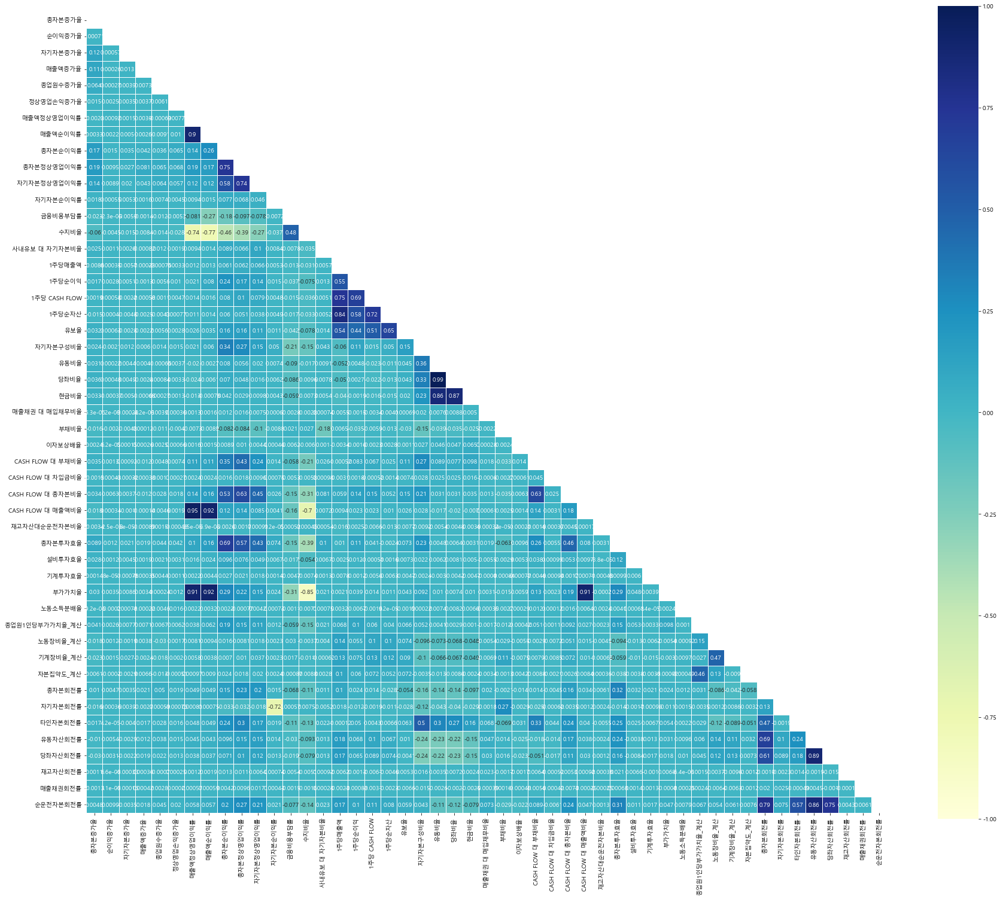

In [113]:
# 상관계수 히트맵

import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["font.family"] = "Malgun Gothic"

plt.figure(figsize=(30,25))

df_part4_corr = df_part5_final.iloc[:, 10:].corr()

mask = np.zeros_like(df_part4_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(df_part5_final.iloc[:, 10:].corr(), annot=True, mask=mask, linewidths=.5, cmap="YlGnBu", square=True, vmin=-1, vmax=1)

plt.show()

In [114]:
# VIF

import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

def feature_engineering_XbyVIF(df_cols):
    vif = pd.DataFrame()
    vif['VIF_Factor'] = [variance_inflation_factor(df_cols.values, i)
                        for i in range(df_cols.shape[1])]
    vif['Feature'] = df_cols.columns
    return vif

In [115]:
feature_vif = feature_engineering_XbyVIF(df_part5_final.iloc[:, 10:])
feature_vif

,VIF_Factor,Feature
0,1.162652,총자본증가율
1,1.000714,순이익증가율
2,1.019699,자기자본증가율
3,1.027068,매출액증가율
4,1.017399,종업원수증가율
5,1.007160,정상영업손익증가율
6,19.600001,매출액정상영업이익률
7,10.816105,매출액순이익률
8,4.380014,총자본순이익률
9,5.180754,총자본정상영업이익률


In [116]:
feature_vif_df = pd.DataFrame(feature_vif)
feature_vif_df.sort_values('VIF_Factor', ascending=False)

,VIF_Factor,Feature
21,121.852463,유동비율
22,113.412564,당좌비율
48,50.016486,순운전자본회전률
44,43.601828,유동자산회전률
6,19.600001,매출액정상영업이익률
30,19.426603,CASH FLOW 대 매출액비율
45,17.865911,당좌자산회전률
35,16.906048,부가가치율
13,14.111516,수지비율
41,13.936761,총자본회전률
